# Poultry in Ireland and Spain

What's going on there? Are they similar? Are they different? And does the cost of feed affect the cost of chicken?

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('Notes/Data/FAOSTAT_data_en_12-19-2022_IRL_SPA_crop_livestock_products.csv')

In [3]:
df.head()

,Domain Code,Domain,Area Code (ISO3),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,TCL,Crops and livestock products,IRL,Ireland,5610,Import Quantity,01929.07,"Abaca, manila hemp, raw",1961,1961,tonnes,NaN,O,Missing value
1,TCL,Crops and livestock products,IRL,Ireland,5610,Import Quantity,01929.07,"Abaca, manila hemp, raw",1962,1962,tonnes,NaN,O,Missing value
2,TCL,Crops and livestock products,IRL,Ireland,5610,Import Quantity,01929.07,"Abaca, manila hemp, raw",1963,1963,tonnes,NaN,O,Missing value
3,TCL,Crops and livestock products,IRL,Ireland,5610,Import Quantity,01929.07,"Abaca, manila hemp, raw",1964,1964,tonnes,NaN,O,Missing value
4,TCL,Crops and livestock products,IRL,Ireland,5610,Import Quantity,01929.07,"Abaca, manila hemp, raw",1965,1965,tonnes,NaN,O,Missing value


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172266 entries, 0 to 172265
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Domain Code       172266 non-null  object 
 1   Domain            172266 non-null  object 
 2   Area Code (ISO3)  172266 non-null  object 
 3   Area              172266 non-null  object 
 4   Element Code      172266 non-null  int64  
 5   Element           172266 non-null  object 
 6   Item Code (CPC)   172266 non-null  object 
 7   Item              172266 non-null  object 
 8   Year Code         172266 non-null  int64  
 9   Year              172266 non-null  int64  
 10  Unit              172266 non-null  object 
 11  Value             164530 non-null  float64
 12  Flag              172266 non-null  object 
 13  Flag Description  172266 non-null  object 
dtypes: float64(1), int64(3), object(10)
memory usage: 18.4+ MB


In [5]:
df = df.dropna(subset=['Value'])

In [6]:
df['Item'].unique()

array(['Abaca, manila hemp, raw', 'Almonds, in shell', 'Almonds, shelled',
       'Animal oils and fats n.e.c.',
       'Animal or vegetable fats and oils and their fractions, chemically modified, except those hydrogenated, inter-esterified, re-esterified or elaidinized; inedible mixtures or preparations of animal or vegetable fats or oils',
       'Anise, badian, coriander, cumin, caraway, fennel and juniper berries, raw',
       'Apple juice', 'Apple juice, concentrated', 'Apples', 'Apricots',
       'Apricots, dried', 'Areca nuts', 'Artichokes', 'Asparagus',
       'Asses', 'Avocados', 'Bananas', 'Barley', 'Barley, pearled',
       'Beans, dry', 'beef and veal preparations nes',
       'Beer of barley, malted', 'Bees', 'Beeswax', 'Beet pulp',
       'Blueberries', 'Bran of maize', 'Bran of wheat',
       'Brazil nuts, shelled', 'Bread', 'Breakfast cereals',
       'Brewing or distilling dregs and waste',
       'Broad beans and horse beans, dry', 'Buckwheat', 'Buffalo',
       'Bulg

In [7]:
df[df['Item']=='Turkeys']

,Domain Code,Domain,Area Code (ISO3),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
77436,TCL,Crops and livestock products,IRL,Ireland,5609,Import Quantity,02152,Turkeys,1961,1961,1000 Head,0.0,A,Official figure
77437,TCL,Crops and livestock products,IRL,Ireland,5609,Import Quantity,02152,Turkeys,1962,1962,1000 Head,0.0,A,Official figure
77438,TCL,Crops and livestock products,IRL,Ireland,5609,Import Quantity,02152,Turkeys,1963,1963,1000 Head,0.0,A,Official figure
77439,TCL,Crops and livestock products,IRL,Ireland,5609,Import Quantity,02152,Turkeys,1964,1964,1000 Head,0.0,A,Official figure
77440,TCL,Crops and livestock products,IRL,Ireland,5609,Import Quantity,02152,Turkeys,1965,1965,1000 Head,0.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165329,TCL,Crops and livestock products,ESP,Spain,5922,Export Value,02152,Turkeys,2016,2016,1000 US$,143.0,A,Official figure
165330,TCL,Crops and livestock products,ESP,Spain,5922,Export Value,02152,Turkeys,2017,2017,1000 US$,172.0,A,Official figure
165331,TCL,Crops and livestock products,ESP,Spain,5922,Export Value,02152,Turkeys,2018,2018,1000 US$,118.0,A,Official figure
165332,TCL,Crops and livestock products,ESP,Spain,5922,Export Value,02152,Turkeys,2019,2019,1000 US$,129.0,A,Official figure


In [8]:
df['Element'].unique()

array(['Import Quantity', 'Import Value', 'Export Quantity',
       'Export Value'], dtype=object)

Getting new data.

# Introduction

Let's look at poultry (meat) farming in Ireland (and Spain). In Ireland, let's see what factors affect chicken prices. I'm mainly going to look at feed and the price of grains. According to an EU factsheet on Irish agriculture, feeding stuff is by far the largest expense in agriculture, around five times the cost of the next largest expense, energy. (This is for all agriculture in Ireland though, so I'm sure cattle data is dominating these stats). Feed stuff for chicken is predominately maize, soya and wheat. Also maybe pig protein, but feeding chickens pigs was only made legal in the EU in Aug 2021 so I'm not going to look into it. Maize and soya are almost entirely imported. Feeding suppliers buy the grains from USA, Ukraine, Russia, etc, and then Irish poultry farmers buy their chicken feed from Irish feed suppliers. It is hard to find stats for feed supplies (especially to only relate to poultry) so I'm going to look at grain prices. 

So, my main question is: do grain prices have an impact on the consumer price of chicken? 

Also, what other factors affect the consumer price of chicken meat? Farm size? Intensive vs free range vs organic? Market demand? 

The price of imported cheap chicken from Brazil, Ukraine and Thailand, driven by fast food in Ireland's high demand for cheap chicken that the high prices of raw feed in Ireland can't meet (teagasc.ie). Apparently cheap imported chicken is undercutting European farmers (the guardian in their article about feeding animals to animals), let's see what's the truth of that.

What's the chicken consumpution per capita of Ireland vs Spain? Price of chicken relative to our gdp? Are we being screwed in our chicken price or is it line with our higher cost of living and wages in general?

## Reading in files

These datasets were collected from FAOSTAT https://www.fao.org/faostat/en/#data

In [9]:
from os import listdir
from os.path import isfile, join
FAOfiles = [f for f in listdir('./datasets/') if isfile(join('./datasets/', f))]

In [10]:
FAOfiles #list of file names, check they're as expected

['eurostat_poultry_holdings_4364731_linear.csv',
 'FAOSTAT_data_en_IRL_SPA_annual_population.csv',
 'FAOSTAT_data_en_IRL_SPA_consumer_price_indices.csv',
 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL.csv',
 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL.csv',
 'FAOSTAT_data_en_IRL_SPA_production_indices.csv',
 'FAOSTAT_data_en_IRL_SPA_trade_indices.csv',
 'FAOSTAT_data_en_IRL_SPA_value_agri_production.csv',
 'FAOSTAT_data_en_structural_data_from_agri_census.csv',
 'FAOSTAT_data_en__IRL_SPA_producer_prices.csv']

In [11]:
df_dict = {}
for file in FAOfiles:
    df_dict[file[:-4]] = pd.read_csv('./datasets/'+file) #using the filenames to generate the dictionary keys to hold the dataframes
    if 'Year' in df_dict[file[:-4]].columns.to_list():
        df_dict[file[:-4]]['Year'] = pd.to_datetime(df_dict[file[:-4]]['Year'], format='%Y') #changing it to datetime is probably pointless but I like to recognise dates as dates

In [12]:
df_dict #check it's as expected

{'eurostat_poultry_holdings_4364731_linear':                    DATAFLOW        LAST UPDATE freq n_head agrarea  \
 0    ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A      0   TOTAL   
 1    ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A      0   TOTAL   
 2    ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A      0   TOTAL   
 3    ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A      0   TOTAL   
 4    ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A      0   TOTAL   
 ..                      ...                ...  ...    ...     ...   
 315  ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A  TOTAL   TOTAL   
 316  ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A  TOTAL   TOTAL   
 317  ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A  TOTAL   TOTAL   
 318  ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A  TOTAL   TOTAL   
 319  ESTAT:EF_LSBROIAA(1.0)  16/01/17 23:00:00    A  TOTAL   TOTAL   
 
              indic_ef geo  TIME_PERIOD  OBS_VALUE  OBS_FLAG  
 0      C_5_1000_HEADS  ES         2013

In [13]:
print(df_dict.keys()) #have the keys handy

dict_keys(['eurostat_poultry_holdings_4364731_linear', 'FAOSTAT_data_en_IRL_SPA_annual_population', 'FAOSTAT_data_en_IRL_SPA_consumer_price_indices', 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL', 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL', 'FAOSTAT_data_en_IRL_SPA_production_indices', 'FAOSTAT_data_en_IRL_SPA_trade_indices', 'FAOSTAT_data_en_IRL_SPA_value_agri_production', 'FAOSTAT_data_en_structural_data_from_agri_census', 'FAOSTAT_data_en__IRL_SPA_producer_prices'])


In [14]:
from os import path, makedirs
if path.exists('./graphs/'):
    print('graphs folder exists')
else:
    makedirs('./graphs/')

graphs folder exists


## Exploring the datasets
What do they contain and what might be useful

### Crops and livestock products (production)

Crop and livestock statistics are recorded for 278 products, covering the following categories: 

1. CROPS PRIMARY: Cereals, Citrus Fruit, Fibre Crops, Fruit, Oil Crops, Oil Crops and Cakes in Oil Equivalent, Pulses, Roots and Tubers, Sugar Crops, Treenuts and Vegetables. Data are expressed in terms of area harvested, production quantity and yield. Cereals: Area and production data on cereals relate to crops harvested for dry grain only. Cereal crops harvested for hay or harvested green for food, feed or silage or used for grazing are therefore excluded. 
2. CROPS PROCESSED: Beer of barley; Cotton lint; Cottonseed; Margarine, short; Molasses; Oil, coconut (copra); Oil, cottonseed; Oil, groundnut; Oil, linseed; Oil, maize; Oil, olive, virgin; Oil, palm; Oil, palm kernel; Oil, rapeseed; Oil, safflower; Oil, sesame; Oil, soybean; Oil, sunflower; Palm kernels; Sugar Raw Centrifugal; Wine.
3. LIVE ANIMALS: Animals live n.e.s.; Asses; Beehives; Buffaloes; Camelids, other; Camels; Cattle; Chickens; Ducks; Geese and guinea fowls; Goats; Horses; Mules; Pigeons, other birds; Pigs; Rabbits and hares; Rodents, other; Sheep; Turkeys. 
4. LIVESTOCK PRIMARY: Beeswax; Eggs (various types); Hides buffalo, fresh; Hides, cattle, fresh; Honey, natural; Meat (ass, bird nes, buffalo, camel, cattle, chicken, duck, game, goat, goose and guinea fowl, horse, mule, Meat nes, meat other camelids, Meat other rodents, pig, rabbit, sheep, turkey); Milk (buffalo, camel, cow, goat, sheep); Offals, nes; Silk-worm cocoons, reelable; Skins (goat, sheep); Snails, not sea; Wool, greasy. 
5. LIVESTOCK PROCESSED: Butter (of milk from sheep, goat, buffalo, cow); Cheese (of milk from goat, buffalo, sheep, cow milk); Cheese of skimmed cow milk; Cream fresh; Ghee (cow and buffalo milk); Lard; Milk (dry buttermilk, skimmed condensed, skimmed cow, skimmed dried, skimmed evaporated, whole condensed, whole dried, whole evaporated); Silk raw; Tallow; Whey (condensed and dry); Yoghurt

*Food and Agriculture Organization of the United Nations (FAO)*

In [15]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1961,1961-01-01,ha,146373.0,A,Official figure
1,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1962,1962-01-01,ha,164219.0,A,Official figure
2,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1963,1963-01-01,ha,173608.0,A,Official figure
3,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1964,1964-01-01,ha,183644.0,A,Official figure
4,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1965,1965-01-01,ha,187790.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2653,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2017,2017-01-01,tonnes,4875957.0,A,Official figure
2654,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2018,2018-01-01,tonnes,8322510.0,A,Official figure
2655,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2019,2019-01-01,tonnes,6041170.0,A,Official figure
2656,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2020,2020-01-01,tonnes,8143510.0,A,Official figure


In [16]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']['Element'].unique()

array(['Area harvested', 'Yield', 'Production', 'Stocks',
       'Yield/Carcass Weight', 'Producing Animals/Slaughtered'],
      dtype=object)

In [17]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']['Unit'].unique()

array(['ha', 'hg/ha', 'tonnes', '1000 Head', '0.1g/An'], dtype=object)

Unit translation \[I have a natural inclination for SI units\]:

- ha = hectare (area) = 10000 m$^2$
- hg/ha = hectogram/hectare (yield of cereal) = 0.1 kg / 10000 m$^2$
- tonnes = 1000 kg
- 1000 Head = 1000 animals (chickens)
- 0.1g/An = 0.1 g per animal

In [18]:
#trying to understand 1000 head because FAO wasn't helpful with the definitions
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL'][df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']['Unit']== '1000 Head']['Element'].unique()

array(['Stocks', 'Producing Animals/Slaughtered'], dtype=object)

In [19]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']['Item'].unique()

array(['Barley', 'Cereals n.e.c.', 'Chickens', 'Maize (corn)',
       'Meat of chickens, fresh or chilled', 'Mixed grain', 'Oats',
       'Soya beans', 'Sunflower seed', 'Wheat', 'Millet'], dtype=object)

In [20]:
items = df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL']['Item'].unique()

In [21]:
items

array(['Barley', 'Cereals n.e.c.', 'Chickens', 'Maize (corn)',
       'Meat of chickens, fresh or chilled', 'Mixed grain', 'Oats',
       'Soya beans', 'Sunflower seed', 'Wheat', 'Millet'], dtype=object)

In [22]:
#splitting the crops and livestock into chicken related and grain related
#i.e. target (chicken) and features (food/grains)
chicken_item = []
grains_item = []
for item in items:
    if 'hicken' in item:
        chicken_item.append(item)
    else:
        grains_item.append(item)

In [23]:
print('Chicken list: ', chicken_item)
print('Grains list: ', grains_item)

Chicken list:  ['Chickens', 'Meat of chickens, fresh or chilled']
Grains list:  ['Barley', 'Cereals n.e.c.', 'Maize (corn)', 'Mixed grain', 'Oats', 'Soya beans', 'Sunflower seed', 'Wheat', 'Millet']


In [24]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2658 entries, 0 to 2657
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       2658 non-null   object        
 1   Domain            2658 non-null   object        
 2   Area Code (M49)   2658 non-null   int64         
 3   Area              2658 non-null   object        
 4   Element Code      2658 non-null   int64         
 5   Element           2658 non-null   object        
 6   Item Code (CPC)   2658 non-null   float64       
 7   Item              2658 non-null   object        
 8   Year Code         2658 non-null   int64         
 9   Year              2658 non-null   datetime64[ns]
 10  Unit              2658 non-null   object        
 11  Value             2658 non-null   float64       
 12  Flag              2658 non-null   object        
 13  Flag Description  2658 non-null   object        
dtypes: datetime64[ns](1), fl

Let's just explore all the datasets, see what's useful about which ones

In [25]:
df_dict.keys() #to remind me

dict_keys(['eurostat_poultry_holdings_4364731_linear', 'FAOSTAT_data_en_IRL_SPA_annual_population', 'FAOSTAT_data_en_IRL_SPA_consumer_price_indices', 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL', 'FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL', 'FAOSTAT_data_en_IRL_SPA_production_indices', 'FAOSTAT_data_en_IRL_SPA_trade_indices', 'FAOSTAT_data_en_IRL_SPA_value_agri_production', 'FAOSTAT_data_en_structural_data_from_agri_census', 'FAOSTAT_data_en__IRL_SPA_producer_prices'])

### Consumer Price Indices

The FAOSTAT monthly Food CPI and General CPI database was based on the ILO CPI data until December 2014. In 2014, IMF-ILO-FAO agreed to transfer global CPI data compilation from ILO to IMF. Upon agreement, CPIs for all items and its sub components originates from the International Monetary Fund (IMF), and the UN Statistics Division(UNSD) for countries not covered by the IMF. However, due to a limited time coverage from IMF and UNSD for a number of countries, the Organisation for Economic Co-operation and Development (OECD), Central Bank of Western African States (BCEAO), Eastern Caribbean Central Bank (ECCB), UNdata, United Nations Conference on Trade and Development (UNCTAD) and national statistical office website data are used for missing historical data from IMF and UNSD food CPI. The FAO CPI dataset for all items(or general CPI) and the Food CPI, consists of a complete and consistent set of time series from January 2000 onwards. Data gaps on monthly Food CPI and General CPI are filled using statistical estimation procedures to have full data coverage for all countries for Food CPI and for General CPI. These indices measure the price change between the current and reference periods of the average basket of goods and services purchased by households. The CPI,all items is typically used to measure and monitor inflation, set monetary policy targets, index social benefits such as pensions and unemployment benefits, and to escalate thresholds and credits in the income tax systems and wages in public and private wage contracts. The FAOSTAT monthly Food CPI inflation rates are annual year-over-year inflation or percentage change over corresponding month of the previous year. The FAOSTAT regional Food CPI and CPI of General are weighted average of Food CPI and General CPI of countries in each region using the weights of HouseHold Final Consumption Expenditure in USD in 2015 from UNSD.

*Food and Agriculture Organization of the United Nations (FAO)*

In [26]:
df_dict['FAOSTAT_data_en_IRL_SPA_consumer_price_indices']

,Domain Code,Domain,Area Code (M49),Area,Year Code,Year,Item Code,Item,Months Code,Months,Unit,Value,Flag,Flag Description,Note
0,CP,Consumer Price Indices,372,Ireland,2000,2000-01-01,23013,"Consumer Prices, Food Indices (2015 = 100)",7001,January,NaN,87.551570,X,Figure from international organizations,base year is 2015
1,CP,Consumer Price Indices,372,Ireland,2000,2000-01-01,23013,"Consumer Prices, Food Indices (2015 = 100)",7002,February,NaN,87.842760,X,Figure from international organizations,base year is 2015
2,CP,Consumer Price Indices,372,Ireland,2000,2000-01-01,23013,"Consumer Prices, Food Indices (2015 = 100)",7003,March,NaN,88.036880,X,Figure from international organizations,base year is 2015
3,CP,Consumer Price Indices,372,Ireland,2000,2000-01-01,23013,"Consumer Prices, Food Indices (2015 = 100)",7004,April,NaN,88.133950,X,Figure from international organizations,base year is 2015
4,CP,Consumer Price Indices,372,Ireland,2000,2000-01-01,23013,"Consumer Prices, Food Indices (2015 = 100)",7005,May,NaN,89.395770,X,Figure from international organizations,base year is 2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1609,CP,Consumer Price Indices,724,Spain,2022,2022-01-01,23014,Food price inflation,7005,May,%,10.984332,E,Estimated value,NaN
1610,CP,Consumer Price Indices,724,Spain,2022,2022-01-01,23014,Food price inflation,7006,June,%,12.949015,E,Estimated value,NaN
1611,CP,Consumer Price Indices,724,Spain,2022,2022-01-01,23014,Food price inflation,7007,July,%,13.525500,E,Estimated value,NaN
1612,CP,Consumer Price Indices,724,Spain,2022,2022-01-01,23014,Food price inflation,7008,August,%,13.754012,E,Estimated value,NaN


In [27]:
df_dict['FAOSTAT_data_en_IRL_SPA_consumer_price_indices'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1614 entries, 0 to 1613
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       1614 non-null   object        
 1   Domain            1614 non-null   object        
 2   Area Code (M49)   1614 non-null   int64         
 3   Area              1614 non-null   object        
 4   Year Code         1614 non-null   int64         
 5   Year              1614 non-null   datetime64[ns]
 6   Item Code         1614 non-null   int64         
 7   Item              1614 non-null   object        
 8   Months Code       1614 non-null   int64         
 9   Months            1614 non-null   object        
 10  Unit              522 non-null    object        
 11  Value             1614 non-null   float64       
 12  Flag              1614 non-null   object        
 13  Flag Description  1614 non-null   object        
 14  Note              1092 n

In [28]:
df_dict['FAOSTAT_data_en_IRL_SPA_consumer_price_indices']['Item'].unique()

array(['Consumer Prices, Food Indices (2015 = 100)',
       'Consumer Prices, General Indices (2015 = 100)',
       'Food price inflation'], dtype=object)

In [29]:
df_dict['FAOSTAT_data_en_IRL_SPA_consumer_price_indices']['Unit'].unique()

array([nan, '%'], dtype=object)

In [30]:
df_dict['FAOSTAT_data_en_IRL_SPA_consumer_price_indices']['Flag'].unique()

array(['X', 'E'], dtype=object)

Flags (https://www.fao.org/faostat/en/#definitions): 

- X: Figure from international organizations
- E: Estimated value

### Crops and livestock products (Trade)

The food and agricultural trade dataset is collected, processed and disseminated by FAO according to the standard International Merchandise Trade Statistics (IMTS) Methodology. The data is mainly provided by UNSD, Eurostat, and other national authorities as needed. This source data is checked for outliers, trade partner data is used for non-reporting countries or missing cells, and data on food aid is added to take into account total cross-border trade flows. The trade database includes the following variables: export quantity, export value, import quantity, and import value. The trade database includes all food and agricultural products imported/exported annually by all the countries in the world.

*Food and Agriculture Organization of the United Nations (FAO)*

In [31]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL'] #trade

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1961,1961-01-01,tonnes,4544.0,A,Official figure
1,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1962,1962-01-01,tonnes,3182.0,A,Official figure
2,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1963,1963-01-01,tonnes,4845.0,A,Official figure
3,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1964,1964-01-01,tonnes,433.0,A,Official figure
4,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1965,1965-01-01,tonnes,80132.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8715,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2017,2017-01-01,1000 US$,76166.0,A,Official figure
8716,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2018,2018-01-01,1000 US$,96977.0,A,Official figure
8717,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2019,2019-01-01,1000 US$,145026.0,A,Official figure
8718,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2020,2020-01-01,1000 US$,180098.0,A,Official figure


In [32]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8720 entries, 0 to 8719
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       8720 non-null   object        
 1   Domain            8720 non-null   object        
 2   Area Code (M49)   8720 non-null   int64         
 3   Area              8720 non-null   object        
 4   Element Code      8720 non-null   int64         
 5   Element           8720 non-null   object        
 6   Item Code (CPC)   8720 non-null   object        
 7   Item              8720 non-null   object        
 8   Year Code         8720 non-null   int64         
 9   Year              8720 non-null   datetime64[ns]
 10  Unit              8720 non-null   object        
 11  Value             8720 non-null   float64       
 12  Flag              8720 non-null   object        
 13  Flag Description  8720 non-null   object        
dtypes: datetime64[ns](1), fl

In [33]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL']['Element'].unique()

array(['Import Quantity', 'Import Value', 'Export Quantity',
       'Export Value'], dtype=object)

In [34]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL']['Item'].unique() #not all the same names as crops and livestock QCL

array(['Barley', 'Barley flour and grits', 'Barley, pearled',
       'Bran of cereals n.e.c.', 'Bran of maize', 'Bran of wheat',
       'Cake of  soya beans', 'Cake of maize', 'Cereals n.e.c.',
       'Chickens',
       'Edible offals and liver of chickens and guinea fowl, fresh, chilled or frozen',
       'Green corn (maize)', 'Maize (corn)',
       'Meat of chickens, fresh or chilled', 'Millet', 'Mixed grain',
       'Poultry fat, rendered', 'Poultry meat preparations',
       'Soya bean oil', 'Soya beans', 'Sunflower seed', 'Wheat',
       'Feed supplements'], dtype=object)

In [35]:
df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL']['Unit'].unique()

array(['tonnes', '1000 US$', '1000 Head'], dtype=object)

### Production Indices

Crop statistics are recorded for 173 products, covering the following categories: Crops Primary, Fibre Crops Primary, Cereals, Coarse Grain, Citrus Fruit, Fruit, Jute Jute-like Fibres, Oilcakes Equivalent, Oil crops Primary, Pulses, Roots and Tubers, Treenuts and Vegetables and Melons. Data are expressed in terms of area harvested, production quantity and yield. The objective is to comprehensively cover production of all primary crops for all countries and regions in the world.

Cereals: Area and production data on cereals relate to crops harvested for dry grain only. Cereal crops harvested for hay or harvested green for food, feed or silage or used for grazing are therefore excluded. Area data relate to harvested area. Some countries report sown or cultivated area only however, in these countries the sown or cultivated area does not differ significantly in normal years from the area actually harvested, either because practically the whole area sown is harvested or because the area surveys are conducted around the harvest period.

Vegetables, total (including melons): Data relate to vegetable crops grown mainly for human consumption. Crops such as cabbages, pumpkins and carrots, when explicitly cultivated for animal feed, are therefore excluded. Statistics on vegetables are not available in many countries, and the coverage of the reported data differs from country to country. In general, it appears that the data refer to crops grown in field and market gardens mainly for sale, thus excluding crops cultivated in kitchen gardens or small family gardens mainly for household consumption.

Fruit, total (excluding melons): Data refer to total production of fresh fruit, whether finally used for direct consumption for food or feed, or processed into different products: dry fruit, juice, jam, alcohol, etc. Generally, production data relate to plantation crops or orchard crops grown mainly for sale. Data on production from scattered trees used mainly for home consumption are not usually collected. Production from wild plants, particularly berries, which is of some importance in certain countries, is generally disregarded by national statistical services. Therefore, the data for the various fruits and berries are rather incomplete. 

Bananas and plantains: Figures on bananas refer, as far as possible, to all edible fruit-bearing species of the genus Musa except Musa paradisiaca, commonly known as plantain. Unfortunately, several countries make no distinction in their statistics between bananas and plantains and publish only overall estimates. When this occurs and there is some indication or assumption that the data reported refer mainly to bananas, the data are included. The production data on bananas and plantains reported by the various countries are also difficult to compare because a number of countries report in terms of bunches, which generally means that the stalk is included in the weight. Dates, plantains and total grapes are included in the *total fruit* aggregated figures, while olives are excluded. 

Treenuts, aggregated: Production of nuts (including chestnuts) relates to nuts in the shell or in the husk. Statistics are very scanty and generally refer only to crops for sale. In addition to the kind of nuts shown separately, production data include all other treenuts mainly used as dessert or table nuts, such as pecan nuts, pili nuts, sapucaia nuts and macadamia nuts. Nuts mainly used for flavouring beverages are excludedas are masticatory and stimulant nuts and nuts used mainly for the extraction of oil or butter, including areca/betel nuts, cola nuts, illipe nuts, karate nuts, coconuts, tung nuts, oilpalm nuts etc.

*Food and Agriculture Organization of the United Nations (FAO)*

In [36]:
df_dict['FAOSTAT_data_en_IRL_SPA_production_indices']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QI,Production Indices,372,Ireland,432,Gross Production Index Number (2014-2016 = 100),01341,Apples,1961,1961-01-01,index,144.52,E,Estimated value
1,QI,Production Indices,372,Ireland,432,Gross Production Index Number (2014-2016 = 100),01341,Apples,1962,1962-01-01,index,154.49,E,Estimated value
2,QI,Production Indices,372,Ireland,432,Gross Production Index Number (2014-2016 = 100),01341,Apples,1963,1963-01-01,index,174.42,E,Estimated value
3,QI,Production Indices,372,Ireland,432,Gross Production Index Number (2014-2016 = 100),01341,Apples,1964,1964-01-01,index,119.60,E,Estimated value
4,QI,Production Indices,372,Ireland,432,Gross Production Index Number (2014-2016 = 100),01341,Apples,1965,1965-01-01,index,104.65,E,Estimated value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18439,QI,Production Indices,724,Spain,434,Gross per capita Production Index Number (2014...,F2054,Food,2016,2016-01-01,index,106.25,E,Estimated value
18440,QI,Production Indices,724,Spain,434,Gross per capita Production Index Number (2014...,F2054,Food,2017,2017-01-01,index,101.75,E,Estimated value
18441,QI,Production Indices,724,Spain,434,Gross per capita Production Index Number (2014...,F2054,Food,2018,2018-01-01,index,117.74,E,Estimated value
18442,QI,Production Indices,724,Spain,434,Gross per capita Production Index Number (2014...,F2054,Food,2019,2019-01-01,index,106.58,E,Estimated value


In [37]:
df_dict['FAOSTAT_data_en_IRL_SPA_production_indices'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18444 entries, 0 to 18443
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       18444 non-null  object        
 1   Domain            18444 non-null  object        
 2   Area Code (M49)   18444 non-null  int64         
 3   Area              18444 non-null  object        
 4   Element Code      18444 non-null  int64         
 5   Element           18444 non-null  object        
 6   Item Code (CPC)   18444 non-null  object        
 7   Item              18444 non-null  object        
 8   Year Code         18444 non-null  int64         
 9   Year              18444 non-null  datetime64[ns]
 10  Unit              18444 non-null  object        
 11  Value             18444 non-null  float64       
 12  Flag              18444 non-null  object        
 13  Flag Description  18444 non-null  object        
dtypes: datetime64[ns](1), 

In [38]:
df_dict['FAOSTAT_data_en_IRL_SPA_production_indices']['Element'].unique() #not sure I understand these. dataset may not be used because I don't do economics

array(['Gross Production Index Number (2014-2016 = 100)',
       'Gross per capita Production Index Number (2014-2016 = 100)'],
      dtype=object)

In [39]:
df_dict['FAOSTAT_data_en_IRL_SPA_production_indices']['Item'].unique() #thats way too many things. I only care about chicken and grains?

array(['Apples', 'Barley', 'Broad beans and horse beans, dry',
       'Broad beans and horse beans, green', 'Cabbages',
       'Carrots and turnips', 'Cauliflowers and broccoli',
       'Cereals n.e.c.',
       'Chillies and peppers, green (Capsicum spp. and Pimenta spp.)',
       'Cucumbers and gherkins', 'Currants', 'Hen eggs in shell, fresh',
       'Hop cones', 'Horse meat, fresh or chilled (indigenous)',
       'Leeks and other alliaceous vegetables', 'Lettuce and chicory',
       'Meat of cattle with the bone, fresh or chilled (indigenous)',
       'Meat of chickens, fresh or chilled (indigenous)',
       'Meat of ducks, fresh or chilled (indigenous)',
       'Meat of geese, fresh or chilled (indigenous)',
       'Meat of pig with the bone, fresh or chilled (indigenous)',
       'Meat of sheep, fresh or chilled (indigenous)',
       'Meat of turkeys, fresh or chilled (indigenous)',
       'Mushrooms and truffles', 'Natural honey', 'Oats',
       'Onions and shallots, dry (excludi

In [40]:
df_dict['FAOSTAT_data_en_IRL_SPA_production_indices']['Unit'].unique() #what is a production index??

array(['index'], dtype=object)

what is a production index in agriculture

In agriculture, a production index is a measure of the efficiency or productivity of an agricultural production system. It can be used to compare the output of a system over time, or to compare the output of different systems or farms. There are many different ways to calculate a production index in agriculture, and the specific formula used can depend on the type of crops or livestock being produced and the goals of the analysis.

Some common elements that may be included in a production index for agriculture include:

1.    Output: This is the total amount of agricultural product produced by the system. It may be measured in units, weight, or some other relevant metric.

2.    Inputs: These are the resources used to produce the output, such as seeds, fertilizers, pesticides, irrigation, labor, and energy. The production index may be adjusted to account for changes in the input mix over time.

3.    Efficiency measures: These are metrics that reflect the efficiency of the production system, such as the utilization of land, water, or other resources, the yield of the crops or livestock, or the quality of the output.

4.    Time period: The production index may be calculated over a specific time period, such as a growing season, a year, or multiple years.

To calculate a production index in agriculture, you can divide the output of the system by the inputs used to produce it, and adjust for any efficiency measures or other factors as appropriate. The resulting index can then be used to compare the performance of the production system over time or against other systems.

### Trade Indices

The food and agricultural trade dataset is collected, processed and disseminated by FAO according to the standard International Merchandise Trade Statistics (IMTS) Methodology. The data is mainly provided by UNSD, Eurostat, and other national authorities as needed. This source data is checked for outliers, trade partner data is used for non-reporting countries or missing cells, and data on food aid is added to take into account total cross-border trade flows. The trade database includes the following variables: export quantity, export value, import quantity, and import value. The trade database includes all food and agricultural products imported/exported annually by all the countries in the world.

*Food and Agriculture Organization of the United Nations (FAO)*


In [41]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,TI,Trade Indices,372,Ireland,64,Import Value Base Period Quantity,115.0,Barley,1961,1961-01-01,1000 $,4433,E,Estimated value
1,TI,Trade Indices,372,Ireland,64,Import Value Base Period Quantity,115.0,Barley,1962,1962-01-01,1000 $,4801,E,Estimated value
2,TI,Trade Indices,372,Ireland,64,Import Value Base Period Quantity,115.0,Barley,1963,1963-01-01,1000 $,4706,E,Estimated value
3,TI,Trade Indices,372,Ireland,64,Import Value Base Period Quantity,115.0,Barley,1964,1964-01-01,1000 $,4704,E,Estimated value
4,TI,Trade Indices,372,Ireland,64,Import Value Base Period Quantity,115.0,Barley,1965,1965-01-01,1000 $,3901,E,Estimated value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8907,TI,Trade Indices,724,Spain,495,Export Quantity Index (2014-2016 = 100),111.0,Wheat,2017,2017-01-01,index,66,E,Estimated value
8908,TI,Trade Indices,724,Spain,495,Export Quantity Index (2014-2016 = 100),111.0,Wheat,2018,2018-01-01,index,83,E,Estimated value
8909,TI,Trade Indices,724,Spain,495,Export Quantity Index (2014-2016 = 100),111.0,Wheat,2019,2019-01-01,index,129,E,Estimated value
8910,TI,Trade Indices,724,Spain,495,Export Quantity Index (2014-2016 = 100),111.0,Wheat,2020,2020-01-01,index,132,E,Estimated value


In [42]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8912 entries, 0 to 8911
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       8912 non-null   object        
 1   Domain            8912 non-null   object        
 2   Area Code (M49)   8912 non-null   int64         
 3   Area              8912 non-null   object        
 4   Element Code      8912 non-null   int64         
 5   Element           8912 non-null   object        
 6   Item Code (CPC)   8912 non-null   float64       
 7   Item              8912 non-null   object        
 8   Year Code         8912 non-null   int64         
 9   Year              8912 non-null   datetime64[ns]
 10  Unit              8912 non-null   object        
 11  Value             8912 non-null   int64         
 12  Flag              8912 non-null   object        
 13  Flag Description  8912 non-null   object        
dtypes: datetime64[ns](1), fl

In [43]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices']['Element'].unique() #not sure I understand this either

array(['Import Value Base Period Quantity',
       'Import Value Base Period Price', 'Export Value Base Quantity',
       'Export Value Base Price', 'Import Value Index (2014-2016 = 100)',
       'Import Unit/Value Index (2014-2016 = 100)',
       'Import Quantity Index (2014-2016 = 100)',
       'Export Value Index (2014-2016 = 100)',
       'Export Unit/Value Index (2014-2016 = 100)',
       'Export Quantity Index (2014-2016 = 100)'], dtype=object)

In [44]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices']['Item'].unique()

array(['Barley', 'Bran of cereals n.e.c.', 'Cake of  soya beans',
       'Maize (corn)', 'Meat of chickens, fresh or chilled', 'Soya beans',
       'Sunflower seed', 'Wheat'], dtype=object)

In [45]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices']['Unit'].unique()

array(['1000 $', 'index'], dtype=object)

In [46]:
df_dict['FAOSTAT_data_en_IRL_SPA_trade_indices']['Flag'].unique()

array(['E'], dtype=object)

### Value of Agricultural Production

Crop statistics are recorded for 173 products, covering the following categories: Crops Primary, Fibre Crops Primary, Cereals, Coarse Grain, Citrus Fruit, Fruit, Jute Jute-like Fibres, Oilcakes Equivalent, Oil crops Primary, Pulses, Roots and Tubers, Treenuts and Vegetables and Melons. Data are expressed in terms of area harvested, production quantity and yield. The objective is to comprehensively cover production of all primary crops for all countries and regions in the world.

Cereals: Area and production data on cereals relate to crops harvested for dry grain only. Cereal crops harvested for hay or harvested green for food, feed or silage or used for grazing are therefore excluded. Area data relate to harvested area. Some countries report sown or cultivated area only however, in these countries the sown or cultivated area does not differ significantly in normal years from the area actually harvested, either because practically the whole area sown is harvested or because the area surveys are conducted around the harvest period.

Vegetables, total (including melons): Data relate to vegetable crops grown mainly for human consumption. Crops such as cabbages, pumpkins and carrots, when explicitly cultivated for animal feed, are therefore excluded. Statistics on vegetables are not available in many countries, and the coverage of the reported data differs from country to country. In general, it appears that the data refer to crops grown in field and market gardens mainly for sale, thus excluding crops cultivated in kitchen gardens or small family gardens mainly for household consumption.

Fruit, total (excluding melons): Data refer to total production of fresh fruit, whether finally used for direct consumption for food or feed, or processed into different products: dry fruit, juice, jam, alcohol, etc. Generally, production data relate to plantation crops or orchard crops grown mainly for sale. Data on production from scattered trees used mainly for home consumption are not usually collected. Production from wild plants, particularly berries, which is of some importance in certain countries, is generally disregarded by national statistical services. Therefore, the data for the various fruits and berries are rather incomplete. 

Bananas and plantains: Figures on bananas refer, as far as possible, to all edible fruit-bearing species of the genus Musa except Musa paradisiaca, commonly known as plantain. Unfortunately, several countries make no distinction in their statistics between bananas and plantains and publish only overall estimates. When this occurs and there is some indication or assumption that the data reported refer mainly to bananas, the data are included. The production data on bananas and plantains reported by the various countries are also difficult to compare because a number of countries report in terms of bunches, which generally means that the stalk is included in the weight. Dates, plantains and total grapes are included in the *total fruit* aggregated figures, while olives are excluded. 

Treenuts, aggregated: Production of nuts (including chestnuts) relates to nuts in the shell or in the husk. Statistics are very scanty and generally refer only to crops for sale. In addition to the kind of nuts shown separately, production data include all other treenuts mainly used as dessert or table nuts, such as pecan nuts, pili nuts, sapucaia nuts and macadamia nuts. Nuts mainly used for flavouring beverages are excludedas are masticatory and stimulant nuts and nuts used mainly for the extraction of oil or butter, including areca/betel nuts, cola nuts, illipe nuts, karate nuts, coconuts, tung nuts, oilpalm nuts etc.

*Food and Agriculture Organization of the United Nations (FAO)*

In [47]:
df_dict['FAOSTAT_data_en_IRL_SPA_value_agri_production']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QV,Value of Agricultural Production,372,Ireland,152,Gross Production Value (constant 2014-2016 tho...,0115,Barley,1961,1961-01-01,1000 Int. $,100413,E,Estimated value
1,QV,Value of Agricultural Production,372,Ireland,152,Gross Production Value (constant 2014-2016 tho...,0115,Barley,1962,1962-01-01,1000 Int. $,117519,E,Estimated value
2,QV,Value of Agricultural Production,372,Ireland,152,Gross Production Value (constant 2014-2016 tho...,0115,Barley,1963,1963-01-01,1000 Int. $,114733,E,Estimated value
3,QV,Value of Agricultural Production,372,Ireland,152,Gross Production Value (constant 2014-2016 tho...,0115,Barley,1964,1964-01-01,1000 Int. $,107291,E,Estimated value
4,QV,Value of Agricultural Production,372,Ireland,152,Gross Production Value (constant 2014-2016 tho...,0115,Barley,1965,1965-01-01,1000 Int. $,119960,E,Estimated value
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2806,QV,Value of Agricultural Production,724,Spain,58,Gross Production Value (constant 2014-2016 tho...,0111,Wheat,2016,2016-01-01,1000 US$,1812197,E,Estimated value
2807,QV,Value of Agricultural Production,724,Spain,58,Gross Production Value (constant 2014-2016 tho...,0111,Wheat,2017,2017-01-01,1000 US$,1122322,E,Estimated value
2808,QV,Value of Agricultural Production,724,Spain,58,Gross Production Value (constant 2014-2016 tho...,0111,Wheat,2018,2018-01-01,1000 US$,1915631,E,Estimated value
2809,QV,Value of Agricultural Production,724,Spain,58,Gross Production Value (constant 2014-2016 tho...,0111,Wheat,2019,2019-01-01,1000 US$,1390525,E,Estimated value


In [48]:
df_dict['FAOSTAT_data_en_IRL_SPA_value_agri_production'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2811 entries, 0 to 2810
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       2811 non-null   object        
 1   Domain            2811 non-null   object        
 2   Area Code (M49)   2811 non-null   int64         
 3   Area              2811 non-null   object        
 4   Element Code      2811 non-null   int64         
 5   Element           2811 non-null   object        
 6   Item Code (CPC)   2811 non-null   object        
 7   Item              2811 non-null   object        
 8   Year Code         2811 non-null   int64         
 9   Year              2811 non-null   datetime64[ns]
 10  Unit              2811 non-null   object        
 11  Value             2811 non-null   int64         
 12  Flag              2811 non-null   object        
 13  Flag Description  2811 non-null   object        
dtypes: datetime64[ns](1), in

In [49]:
df_dict['FAOSTAT_data_en_IRL_SPA_value_agri_production']['Element'].unique() #SLC = standard local currency, i.e. euros
#I$ = international dollars
#Just pick one and ignore the rest

array(['Gross Production Value (constant 2014-2016 thousand I$)',
       'Gross Production Value (current thousand SLC)',
       'Gross Production Value (constant 2014-2016 thousand SLC)',
       'Gross Production Value (current thousand US$)',
       'Gross Production Value (constant 2014-2016 thousand US$)'],
      dtype=object)

In [50]:
df_dict['FAOSTAT_data_en_IRL_SPA_value_agri_production']['Unit'].unique()

array(['1000 Int. $', '1000 SLC', '1000 US$'], dtype=object)

### Producer Prices

This sub-domain contains data on Agriculture Producer Prices and Producer Price Index. Agriculture Producer Prices are prices received by farmers for primary crops, live animals and livestock primary products as collected at the point of initial sale (prices paid at the farm-gate). Annual data are provided from 1991, while mothly data from January 2010 for 180 country and 212 product. Producer Price Index is the index of agricultural producer prices that measures the average annual change over time in the selling prices received by farmers (prices at the farm-gate or at the first point of sale). The three categories of producer price index available in FAOSTAT comprise: single-item price index, commodity group index and the agriculture producer price index.

*Food and Agriculture Organization of the United Nations (FAO)*

In [51]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Months Code,Months,Unit,Value,Flag,Flag Description
0,PP,Producer Prices,372,Ireland,5532,Producer Price (USD/tonne),0115,Barley,1991,1991-01-01,7021,Annual value,USD,173.80,A,Official figure
1,PP,Producer Prices,372,Ireland,5532,Producer Price (USD/tonne),0115,Barley,1992,1992-01-01,7021,Annual value,USD,173.50,A,Official figure
2,PP,Producer Prices,372,Ireland,5532,Producer Price (USD/tonne),0115,Barley,1993,1993-01-01,7021,Annual value,USD,140.30,A,Official figure
3,PP,Producer Prices,372,Ireland,5532,Producer Price (USD/tonne),0115,Barley,1994,1994-01-01,7021,Annual value,USD,130.10,A,Official figure
4,PP,Producer Prices,372,Ireland,5532,Producer Price (USD/tonne),0115,Barley,1995,1995-01-01,7021,Annual value,USD,168.30,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
851,PP,Producer Prices,724,Spain,5539,Producer Price Index (2014-2016 = 100),0111,Wheat,2017,2017-01-01,7021,Annual value,NaN,95.43,I,Imputed value
852,PP,Producer Prices,724,Spain,5539,Producer Price Index (2014-2016 = 100),0111,Wheat,2018,2018-01-01,7021,Annual value,NaN,94.91,I,Imputed value
853,PP,Producer Prices,724,Spain,5539,Producer Price Index (2014-2016 = 100),0111,Wheat,2019,2019-01-01,7021,Annual value,NaN,98.52,I,Imputed value
854,PP,Producer Prices,724,Spain,5539,Producer Price Index (2014-2016 = 100),0111,Wheat,2020,2020-01-01,7021,Annual value,NaN,99.97,I,Imputed value


In [52]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 856 entries, 0 to 855
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       856 non-null    object        
 1   Domain            856 non-null    object        
 2   Area Code (M49)   856 non-null    int64         
 3   Area              856 non-null    object        
 4   Element Code      856 non-null    int64         
 5   Element           856 non-null    object        
 6   Item Code (CPC)   856 non-null    object        
 7   Item              856 non-null    object        
 8   Year Code         856 non-null    int64         
 9   Year              856 non-null    datetime64[ns]
 10  Months Code       856 non-null    int64         
 11  Months            856 non-null    object        
 12  Unit              329 non-null    object        
 13  Value             856 non-null    float64       
 14  Flag              856 non-

In [53]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Element'].unique()

array(['Producer Price (USD/tonne)',
       'Producer Price Index (2014-2016 = 100)'], dtype=object)

In [54]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Item'].unique()

array(['Barley', 'Cereals n.e.c.', 'Maize (corn)',
       'Meat of chickens, fresh or chilled',
       'Meat of chickens, fresh or chilled (biological)', 'Oats', 'Wheat',
       'Millet', 'Mixed grain', 'Soya beans', 'Sunflower seed'],
      dtype=object)

In [55]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Unit'].unique()

array(['USD', nan], dtype=object)

In [56]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Flag'].unique()

array(['A', 'I'], dtype=object)

In [57]:
df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Flag Description'].unique()

array(['Official figure', 'Imputed value'], dtype=object)

Units:

- LCU = local currency units
- SLC = standard local currency (what's the difference??)
- USD = US dollars

### Structural data from agricultural censuses

Data from censuses of agriculture are collected at holding level and provide information about the structure of agriculture of a country or a territory (e.g. size and number of holdings, land tenure, legal status, and holder gender). An agricultural holding is an economic unit of agricultural production under single management comprising all livestock kept and all land used wholly or partly for agricultural production purposes. Member countries provided census data to FAO under the World Programme for the Census of Agriculture (WCA). National censuses are conducted at least once every ten years in an internationally comparable way. The ‘’Structural data from agricultural censuses’’ domain in FAOSTAT provides structural data from the last four WCA rounds (WCA 2020, 2010, 2000 and 1990) for each participating country and territory, to the extent possible. For earlier rounds (WCA 1930, 1950, 1960, 1970 and 1980) data are provided only on the number and area of holdings. The data are prepared based on the national census reports, later disseminated by FAO through the publications SDS 17, SDS 12 and SDS 9 and 9a, and recent methodological review of the available country census data of WCA 2020 round.

*Food and Agriculture Organization of the United Nations (FAO)*

In [58]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,WCA Round,Census Year,Unit,Value,Flag,Flag Description,Note
0,WCAD,Structural data from agricultural censuses,372,Ireland,50260,Area,27002,Holdings,1930,1929,ha,6199000.00,A,Official figure,NaN
1,WCAD,Structural data from agricultural censuses,372,Ireland,5017,Average area,27002,Holdings,1930,1929,ha,17.76,E,Estimated value,NaN
2,WCAD,Structural data from agricultural censuses,372,Ireland,60850,Number,27002,Holdings,1930,1929,No,349000.00,A,Official figure,NaN
3,WCAD,Structural data from agricultural censuses,372,Ireland,50260,Area,27002,Holdings,1950,1949,ha,5873000.00,A,Official figure,NaN
4,WCAD,Structural data from agricultural censuses,372,Ireland,5017,Average area,27002,Holdings,1950,1949,ha,15.48,E,Estimated value,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,WCAD,Structural data from agricultural censuses,724,Spain,60851,Number,270090,"Household members, engaged in agriculture, total",2010,2009,persons,1089900.00,A,Official figure,NaN
264,WCAD,Structural data from agricultural censuses,724,Spain,60851,Number,27010,Hired permanent workers,2000,1999,persons,211731.00,A,Official figure,NaN
265,WCAD,Structural data from agricultural censuses,724,Spain,5019,Average persons per holding,27010,Hired permanent workers,2000,1999,persons,0.12,E,Estimated value,NaN
266,WCAD,Structural data from agricultural censuses,724,Spain,60851,Number,27010,Hired permanent workers,2010,2009,persons,275260.00,A,Official figure,Data correspond to 'Regular non-family labour ...


In [59]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268 entries, 0 to 267
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Domain Code       268 non-null    object 
 1   Domain            268 non-null    object 
 2   Area Code (M49)   268 non-null    int64  
 3   Area              268 non-null    object 
 4   Element Code      268 non-null    int64  
 5   Element           268 non-null    object 
 6   Item Code         268 non-null    int64  
 7   Item              268 non-null    object 
 8   WCA Round         268 non-null    int64  
 9   Census Year       268 non-null    int64  
 10  Unit              268 non-null    object 
 11  Value             268 non-null    float64
 12  Flag              268 non-null    object 
 13  Flag Description  268 non-null    object 
 14  Note              111 non-null    object 
dtypes: float64(1), int64(5), object(9)
memory usage: 31.5+ KB


In [60]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['Element'].unique() #farm data

array(['Area', 'Average area', 'Number',
       'Average number of parcels per holding',
       'Percentage of total area', 'Percent of total number',
       'Percent of total persons', 'Average persons per holding'],
      dtype=object)

In [61]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['Item'].unique()

array(['Holdings', 'Holdings with land size 0-<1',
       'Holdings with land size 1-<2', 'Holdings with land size 2-<3',
       'Holdings with land size 2-<5', 'Holdings with land size 3-<4',
       'Holdings with land size 4-<5', 'Holdings with land size 5-<10',
       'Holdings with land size 10-<20', 'Holdings with land size 20-<50',
       'Holdings with land size 50-<100',
       'Holdings with land size 100-<200',
       'Holdings with land size 200-<500', 'Parcels',
       'Holdings owned by the holder or in owner-like possession',
       'Holdings rented from others',
       'Holdings operated under other forms of tenure', 'Civil persons',
       'Juridical', 'Holdings operated by civil persons, male',
       'Holdings operated by civil persons, female',
       'Holdings operated by civil persons, total',
       'Household members, engaged in agriculture, male',
       'Household members, engaged in agriculture, female',
       'Household members, engaged in agriculture, total

In [62]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['WCA Round'].unique() #world census agriculture

array([1930, 1950, 1960, 1970, 1980, 1990, 2000, 2010], dtype=int64)

In [63]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['Unit'].unique()

array(['ha', 'No', '%', 'persons'], dtype=object)

In [64]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['Flag Description'].unique()

array(['Official figure', 'Estimated value', 'Unofficial figure'],
      dtype=object)

In [65]:
df_dict['FAOSTAT_data_en_structural_data_from_agri_census']['Note'].unique()

array([nan, 'Agricultural area', 'UAA. Interpolated data',
       'Agricultural area. < 2 ha', 'UAA', 'Agricultural area.',
       'Category of land use for most European countries is UAA (Utilized Agricultural Area)',
       'Eurostat reports gender breakdown only for managers, which include both holders (civil persons) that manage the holding themselves and managers that are not holders, including of legal units.',
       'Includes full time and part time engaged in agriculture.',
       "Data correspond to 'Regular non-family labour force'.",
       'Interpolated data'], dtype=object)

### Annual population

The FAOSTAT Population module contains time series data on population, by sex and urban/rural. The series consist of both estimates and projections for different periods as available from the original sources, namely:
1. Population data refers to the World Population Prospects: The 2019 Revision from the UN Population Division.
2. Urban/rural population data refers to the World Urbanization Prospects: The 2018 Revision from the UN Population Division.

*Food and Agriculture Organization of the United Nations*

In [66]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,OA,Annual population,372,Ireland,511,Total Population - Both sexes,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,2906.599,X,Figure from international organizations,NaN
1,OA,Annual population,372,Ireland,512,Total Population - Male,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1478.504,X,Figure from international organizations,NaN
2,OA,Annual population,372,Ireland,513,Total Population - Female,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1428.096,X,Figure from international organizations,NaN
3,OA,Annual population,372,Ireland,551,Rural population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1745.289,X,Figure from international organizations,NaN
4,OA,Annual population,372,Ireland,561,Urban population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1167.804,X,Figure from international organizations,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,OA,Annual population,724,Spain,511,Total Population - Both sexes,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,47486.935,X,Figure from international organizations,NaN
716,OA,Annual population,724,Spain,512,Total Population - Male,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,23271.722,X,Figure from international organizations,NaN
717,OA,Annual population,724,Spain,513,Total Population - Female,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,24215.213,X,Figure from international organizations,NaN
718,OA,Annual population,724,Spain,551,Rural population,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,8799.411,X,Figure from international organizations,NaN


In [67]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Domain Code       720 non-null    object        
 1   Domain            720 non-null    object        
 2   Area Code (M49)   720 non-null    int64         
 3   Area              720 non-null    object        
 4   Element Code      720 non-null    int64         
 5   Element           720 non-null    object        
 6   Item Code         720 non-null    int64         
 7   Item              720 non-null    object        
 8   Year Code         720 non-null    int64         
 9   Year              720 non-null    datetime64[ns]
 10  Unit              720 non-null    object        
 11  Value             720 non-null    float64       
 12  Flag              720 non-null    object        
 13  Flag Description  720 non-null    object        
 14  Note              0 non-nu

In [68]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']['Element'].unique()

array(['Total Population - Both sexes', 'Total Population - Male',
       'Total Population - Female', 'Rural population',
       'Urban population'], dtype=object)

In [69]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']['Item'].unique()

array(['Population - Est. & Proj.'], dtype=object)

In [70]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']['Unit'].unique()

array(['1000 persons'], dtype=object)

In [71]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']['Flag Description'].unique()

array(['Figure from international organizations'], dtype=object)

In [72]:
df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']['Note'].unique()

array([nan])

### Poultry: number of farms and heads by agricultural size of farm (UAA) and size of broiler flock

Source: Eurostat

In [73]:
df_dict['eurostat_poultry_holdings_4364731_linear']

,DATAFLOW,LAST UPDATE,freq,n_head,agrarea,indic_ef,geo,TIME_PERIOD,OBS_VALUE,OBS_FLAG
0,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,0,TOTAL,C_5_1000_HEADS,ES,2013,78650,NaN
1,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,0,TOTAL,C_5_1000_HEADS,IE,2013,2980,NaN
2,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,0,TOTAL,C_5_1000_HEADS,PL,2013,59290,NaN
3,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,0,TOTAL,C_5_1000_HEADS,UK,2013,59550,NaN
4,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,0,TOTAL,C_5_1_1000_HEADS,ES,2013,0,NaN
...,...,...,...,...,...,...,...,...,...,...
315,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,TOTAL,TOTAL,C_LIVESTOCK_HOLD,UK,2013,139950,NaN
316,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,TOTAL,TOTAL,HOLD_HOLD,ES,2013,965000,NaN
317,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,TOTAL,TOTAL,HOLD_HOLD,IE,2013,139600,NaN
318,ESTAT:EF_LSBROIAA(1.0),16/01/17 23:00:00,A,TOTAL,TOTAL,HOLD_HOLD,PL,2013,1429010,NaN


In [74]:
df_dict['eurostat_poultry_holdings_4364731_linear'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320 entries, 0 to 319
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATAFLOW     320 non-null    object 
 1   LAST UPDATE  320 non-null    object 
 2   freq         320 non-null    object 
 3   n_head       320 non-null    object 
 4   agrarea      320 non-null    object 
 5   indic_ef     320 non-null    object 
 6   geo          320 non-null    object 
 7   TIME_PERIOD  320 non-null    int64  
 8   OBS_VALUE    320 non-null    int64  
 9   OBS_FLAG     0 non-null      float64
dtypes: float64(1), int64(2), object(7)
memory usage: 25.1+ KB


In [75]:
df_dict['eurostat_poultry_holdings_4364731_linear']['n_head'].unique()

array(['0', '1-99', '100-999', '1000-2999', '10000-49999', '3000-4999',
       '5000-9999', '50000-99999', 'GE100000', 'TOTAL'], dtype=object)

In [76]:
df_dict['eurostat_poultry_holdings_4364731_linear']['agrarea'].unique()

array(['TOTAL'], dtype=object)

In [77]:
df_dict['eurostat_poultry_holdings_4364731_linear']['indic_ef'].unique()

array(['C_5_1000_HEADS', 'C_5_1_1000_HEADS', 'C_5_1_HOLD',
       'C_5_2_1000_HEADS', 'C_5_2_HOLD', 'C_5_HOLD', 'C_LIVESTOCK_HOLD',
       'HOLD_HOLD'], dtype=object)

| column code | column label | value code | value label |
| --- | :-- | --- | :-- |
| **freq** | **Time Frequency** | A | Annual |
| **n_heads** | **Number of heads** | 0 | No Heads |
| | | TOTAL | Total |
| | | 1-99 | From 1 to 99 heads |
| | | 100-999| From 100 to 999 heads |
| | | 1000-2999 | From 1 000 to 2 999 heads |
| | | 3000-4999 | From 3 000 to 4 999 heads |
| | | 5000-9999 | From 5 000 to 9 999 heads |
| | | 10000-49999 | From 10 000 to 49 999 heads |
| | | 50000-99999 | From 50 000 to 99 999 heads |
| | | GE100000 | 100 000 heads or more |
| **agrarea** | **Agricultural area** | TOTAL | Total |
| **indic_ef** | **Eurofarm indicators** | HOLD_HOLD | hold: Total number of holdings |
| | | C_LIVESTOCK_HOLD| hold: Number of holdings with livestock |
| | | C_5_1000_HEADS | 1000 heads: Poultry |
| | | C_5_HOLD | hold: Poultry|
| | | C_5_1_1000_HEADS | 1000 heads: Poultry - broilers |
| | | C_5_1_HOLD | hold: Poultry - broilers|
| | | C_5_2_1000_HEADS | 1000 heads: Laying hens |
| | | C_5_2_HOLD | hold: Laying hens |
| **geo** | **Geopolitical entity (reporting)** | IE | Ireland |
| | | ES | Spain |

This is a last minute addition because I needed something for statistics. Eurostat doesn't flow as nicely as FAOstat and the datasets are harder to customise but this is useful information.

## Datasets of interest
I think crops and livestock QCL (Production: Crops and livestock products) and TCL (Trade: Crops and livestock products) are my two most important datasets so we'll focus on them for now

In [78]:
df_QCL = df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_QCL'] #I don't need to do this but renaming means less typing
df_TCL = df_dict['FAOSTAT_data_en_IRL_SPA_crops_and_livestock_products_TCL']

In [79]:
df_QCL

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1961,1961-01-01,ha,146373.0,A,Official figure
1,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1962,1962-01-01,ha,164219.0,A,Official figure
2,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1963,1963-01-01,ha,173608.0,A,Official figure
3,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1964,1964-01-01,ha,183644.0,A,Official figure
4,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1965,1965-01-01,ha,187790.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2653,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2017,2017-01-01,tonnes,4875957.0,A,Official figure
2654,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2018,2018-01-01,tonnes,8322510.0,A,Official figure
2655,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2019,2019-01-01,tonnes,6041170.0,A,Official figure
2656,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2020,2020-01-01,tonnes,8143510.0,A,Official figure


In [80]:
#plot graphs here. All the different things vs year.

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px #who knows what i'll need but cover the basics

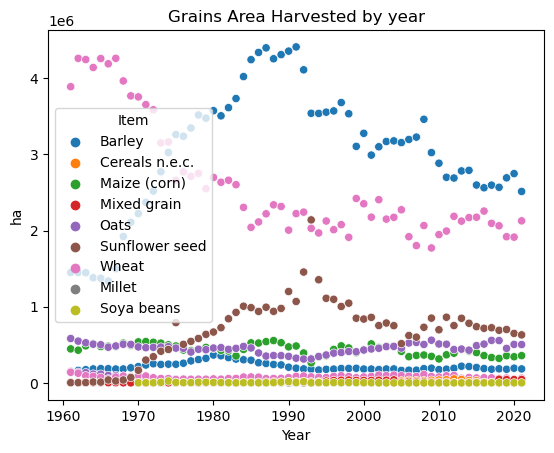

In [82]:
sns.scatterplot(data=df_QCL[df_QCL['Element']=='Area harvested'], x="Year", y="Value", hue='Item')
plt.ylabel(df_QCL['Unit'][df_QCL['Element']=='Area harvested'].unique()[0])
plt.xlabel('Year')
plt.title('Grains Area Harvested by year')
plt.show()
#this is a bad graph but it is the inspo for the next lot of graphs

In [83]:
df_QCL['Unit'][df_QCL['Element']=='Area harvested'].unique()[0]

'ha'

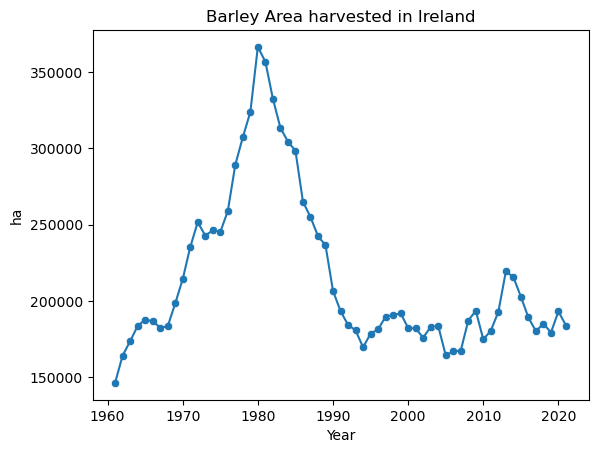

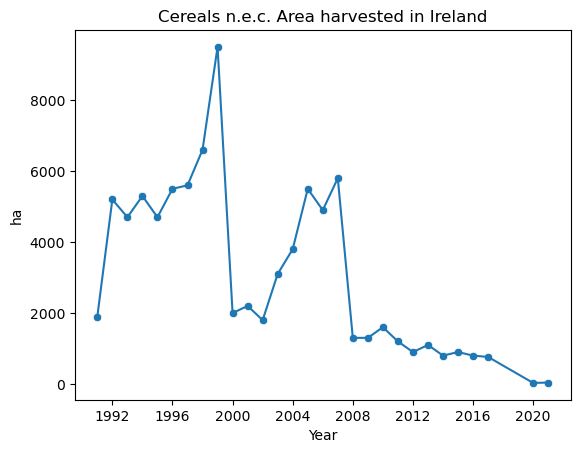

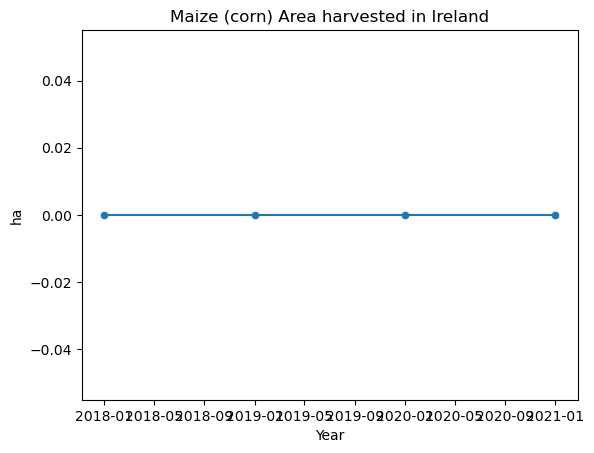

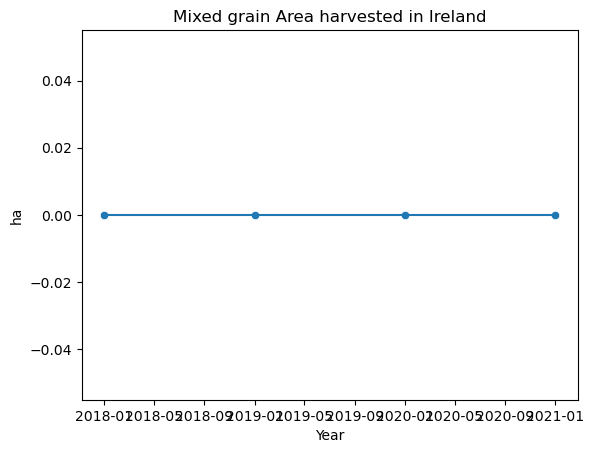

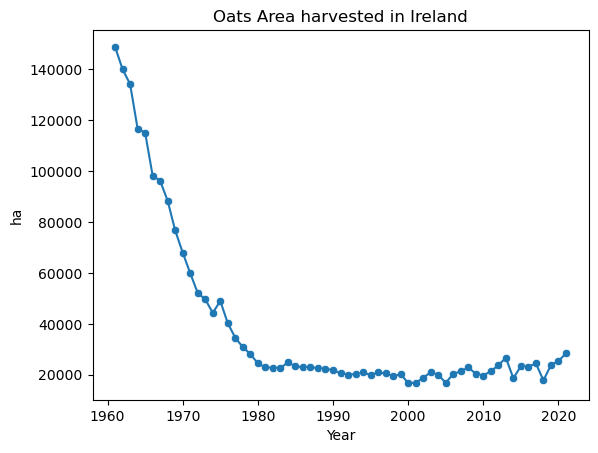

...

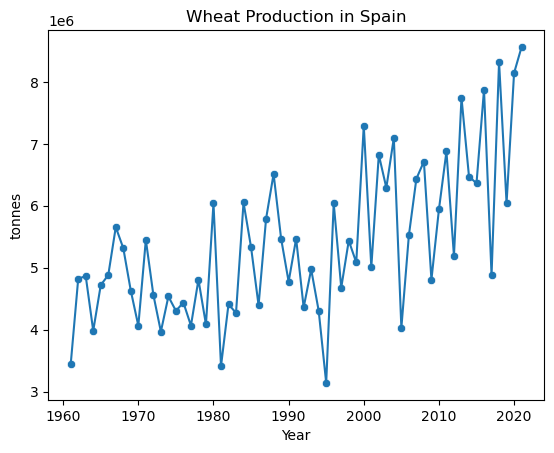

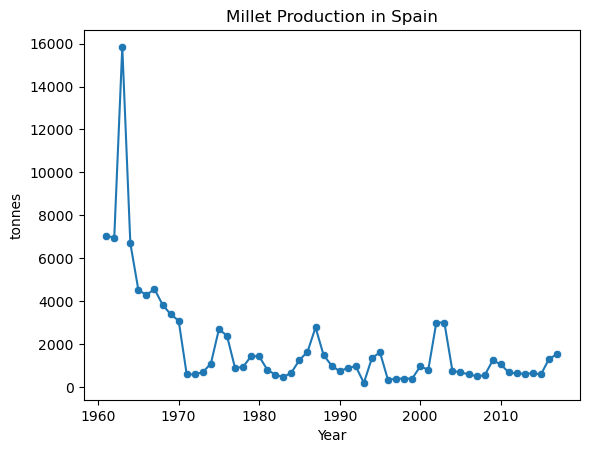

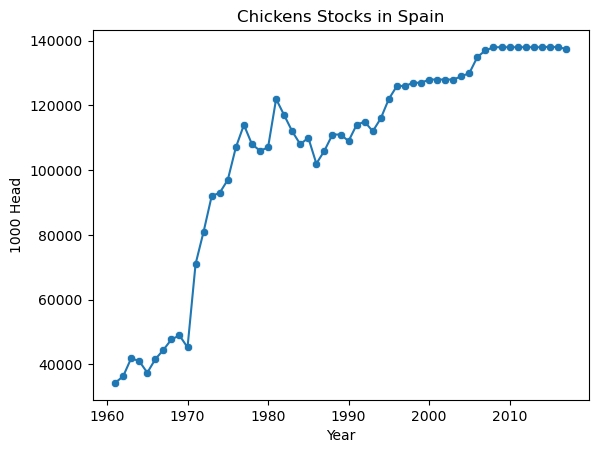

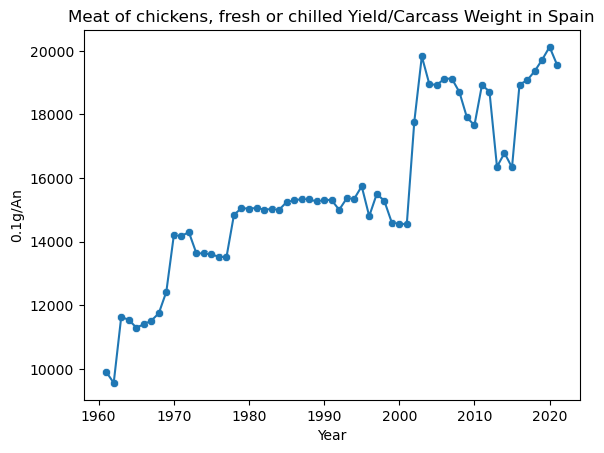

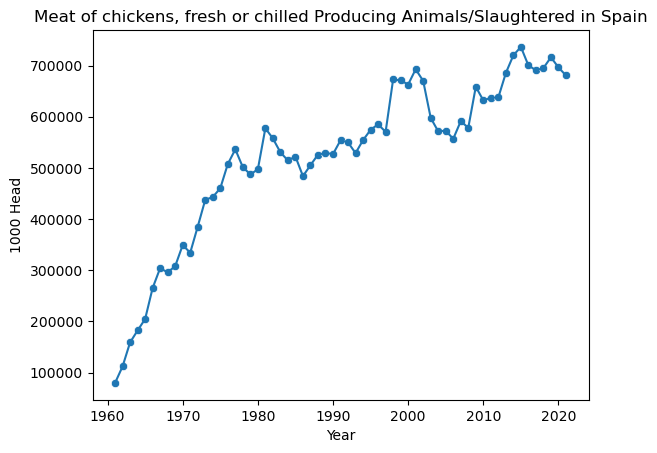

In [84]:
#graphs of all the item elements for Ireland and then Spain in the Production: Crops and livestock products dataset

for country in df_QCL['Area'].unique(): #ireland and spain
    for element in df_QCL['Element'].unique(): #area harvested, yield, production, etc.
        for item in df_QCL['Item'].unique(): #barley, wheat, maize, chicken, etc.
            
            df = df_QCL[df_QCL['Area'] == country]
            df = df[df['Element'] == element]
            
            if item in df['Item'].values:

                sns.lineplot(data=df[df['Item']==item], x='Year', y='Value')
                sns.scatterplot(data=df[df['Item']==item], x='Year', y='Value')
                 
                plt.xlabel('Year')
                plt.ylabel(df['Unit'].unique()[0])
                plt.title(item + ' ' + element + ' in ' + country)
                plt.show()

In [85]:
#remove mixed grain, sunflower, soya and maize from irish dataset
#remove the lowest value counts data - done below

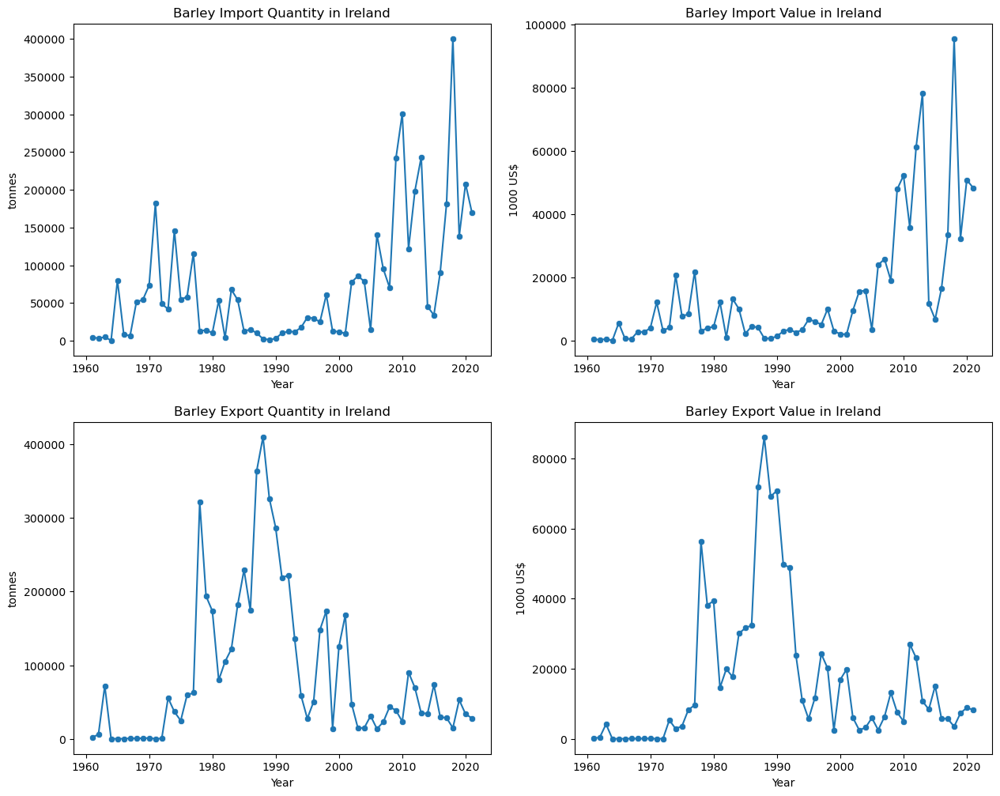

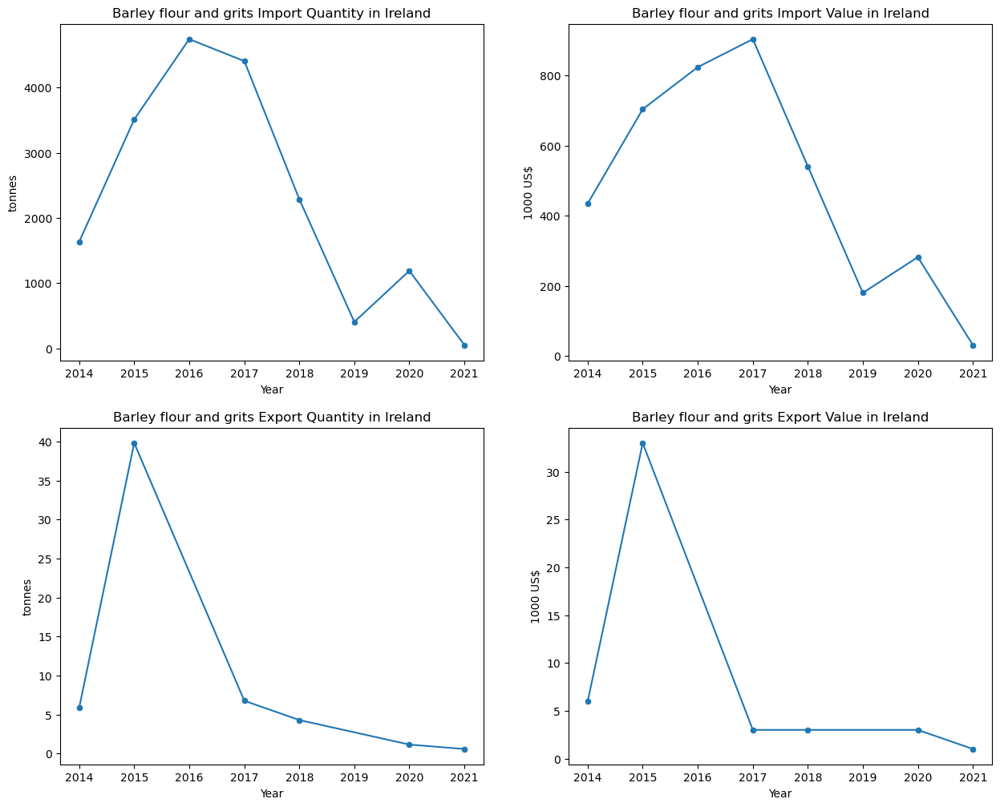

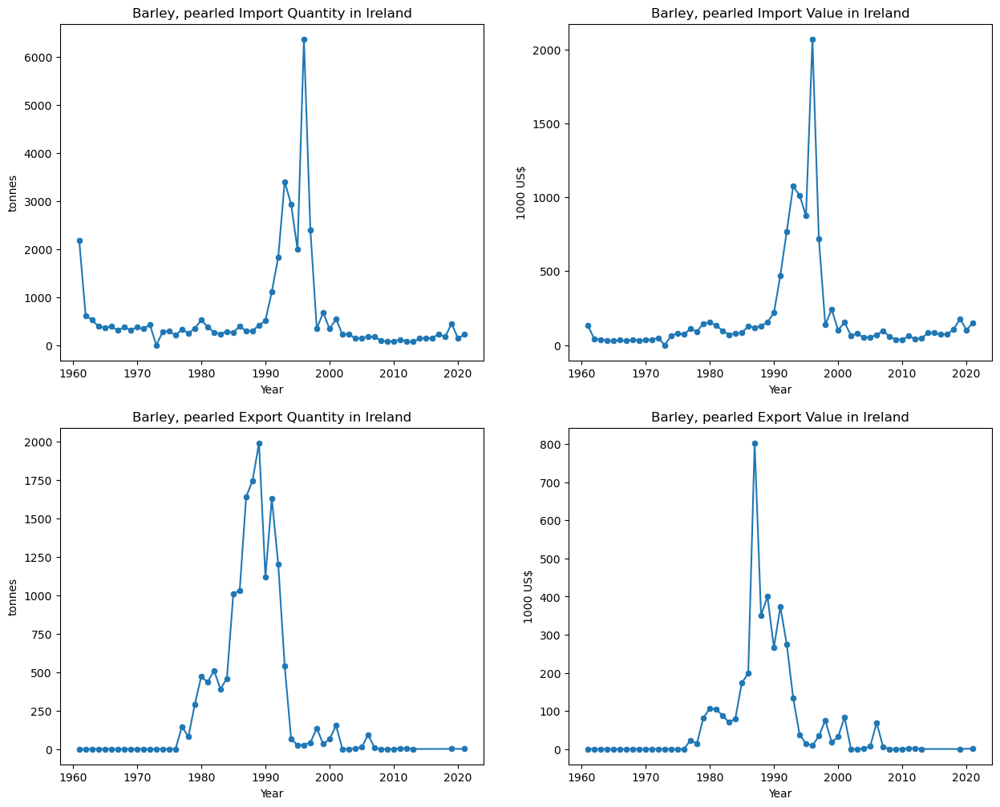

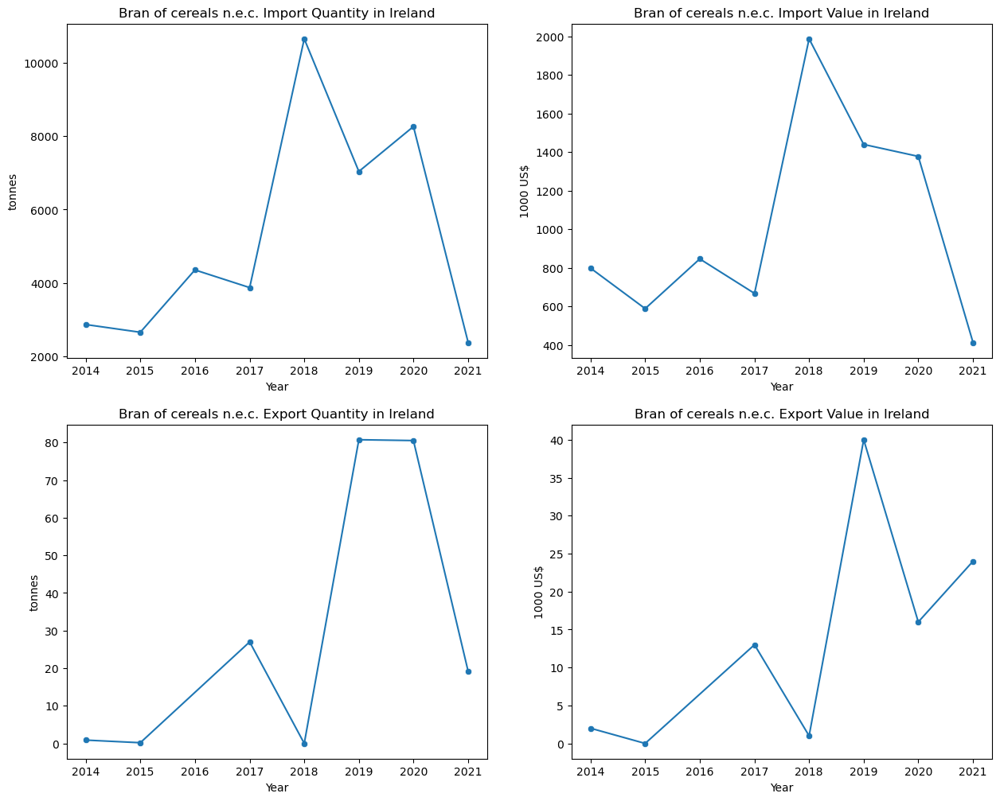

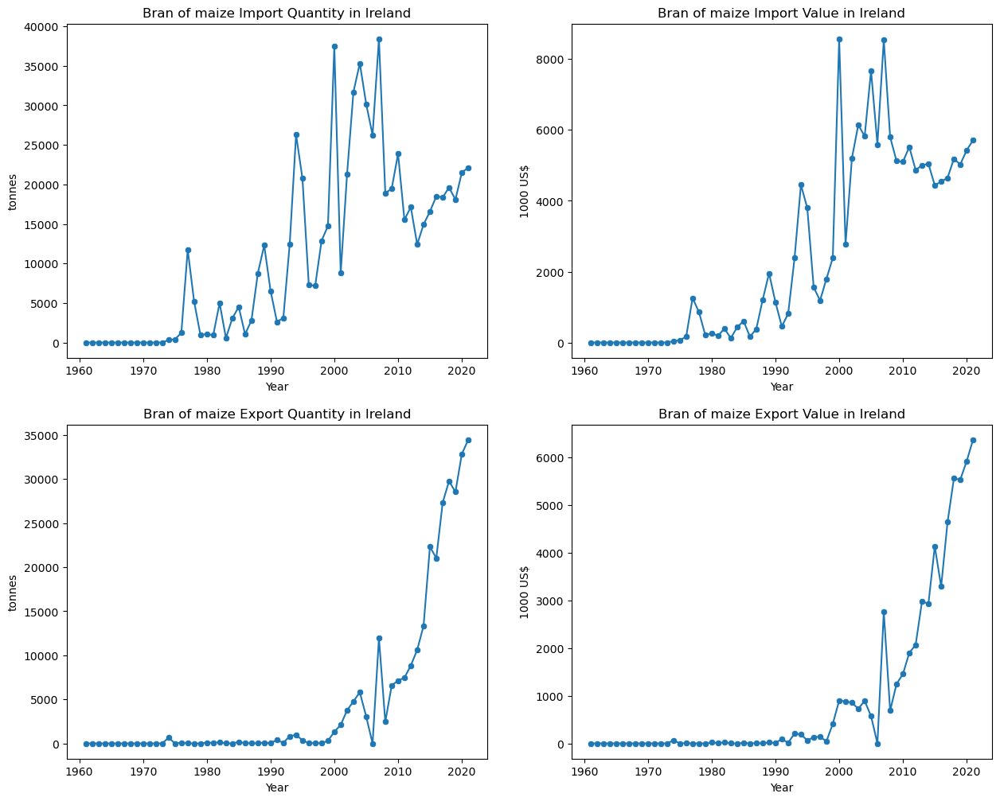

...

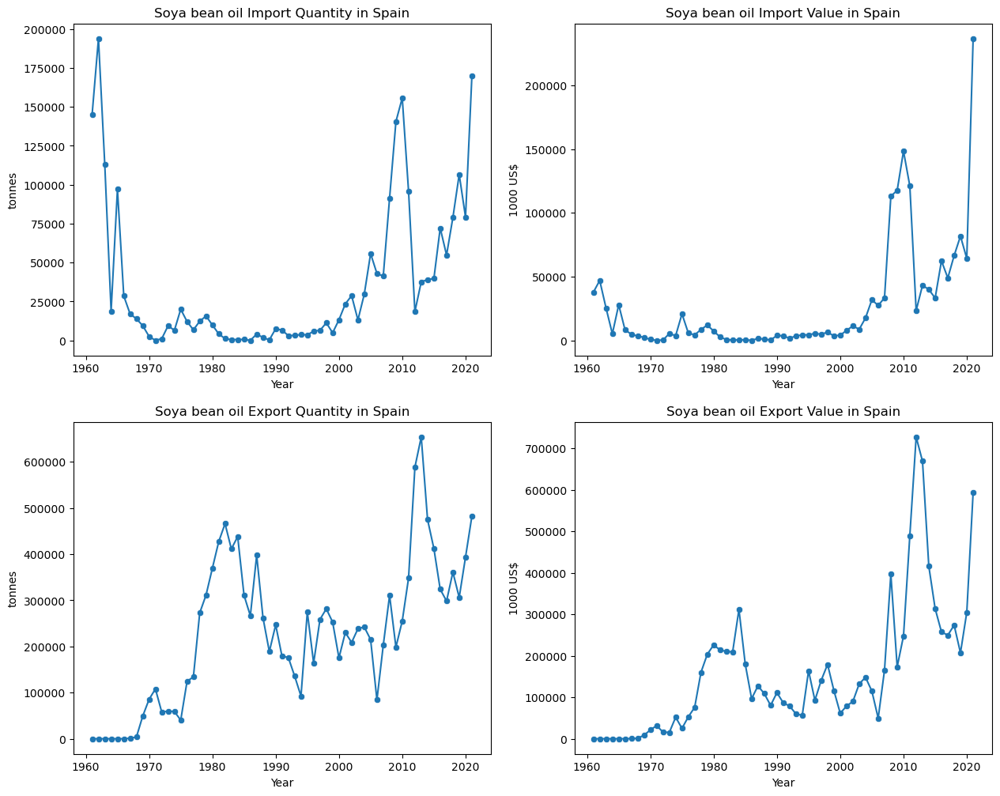

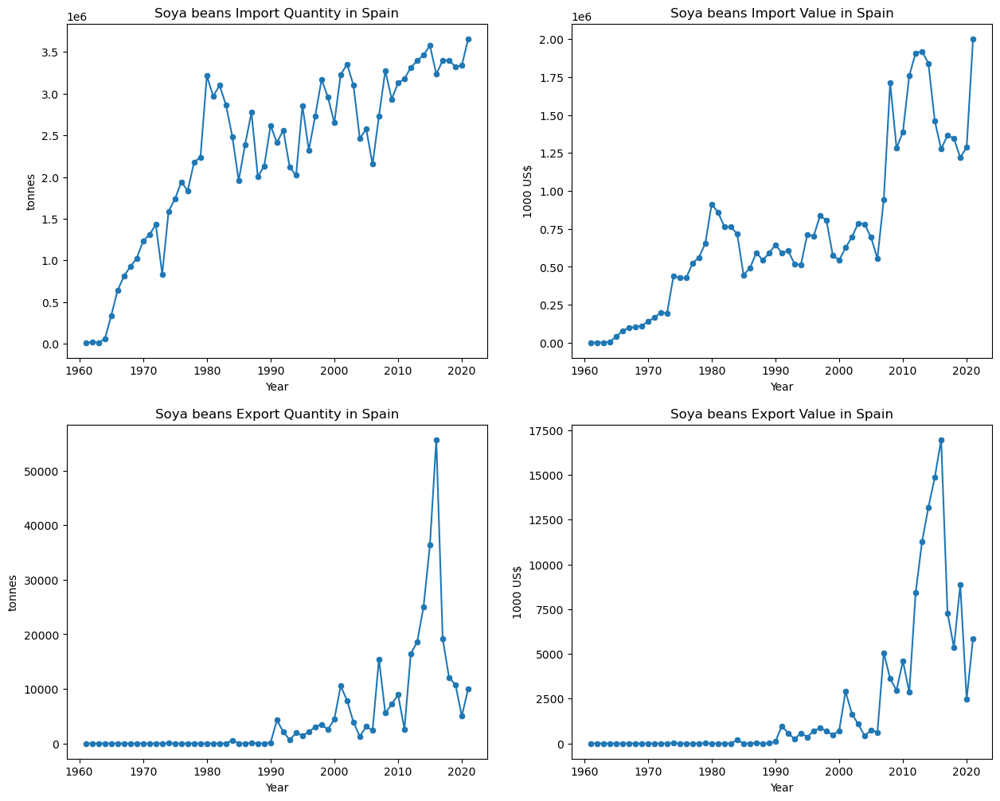

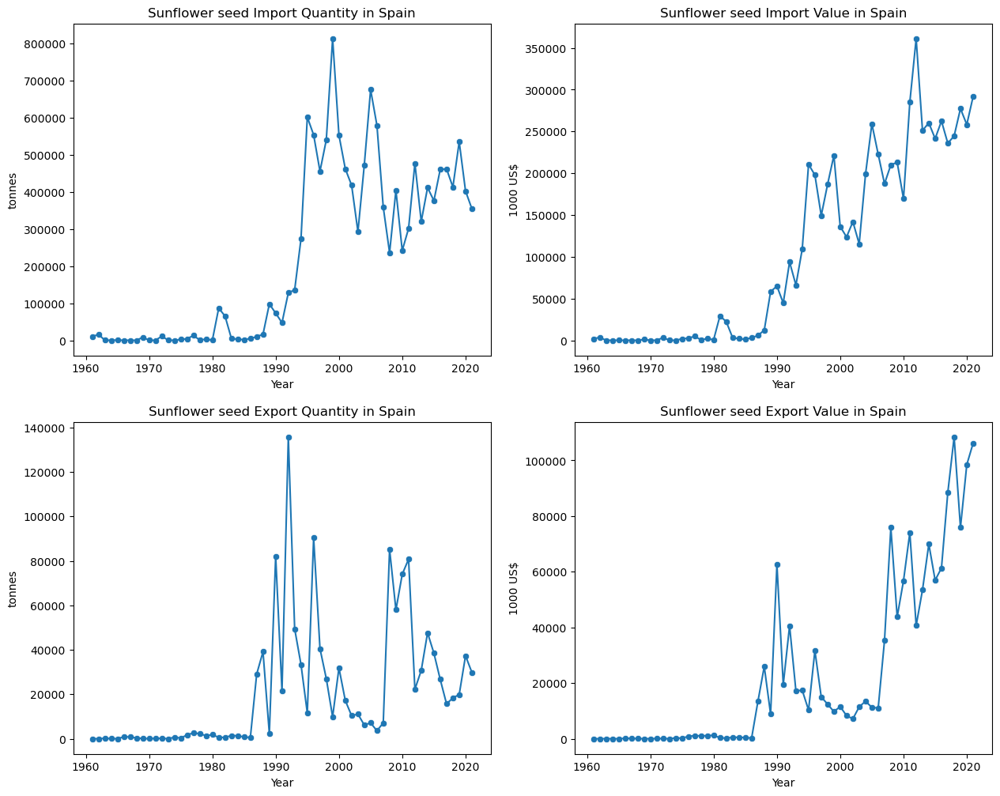

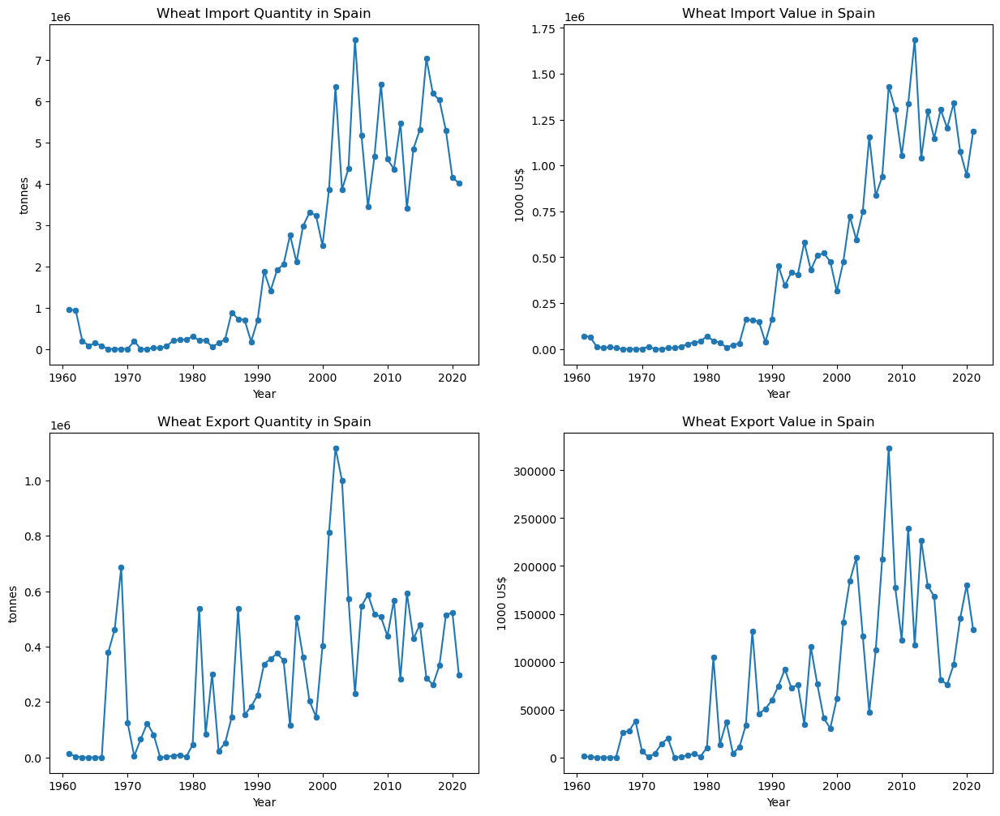

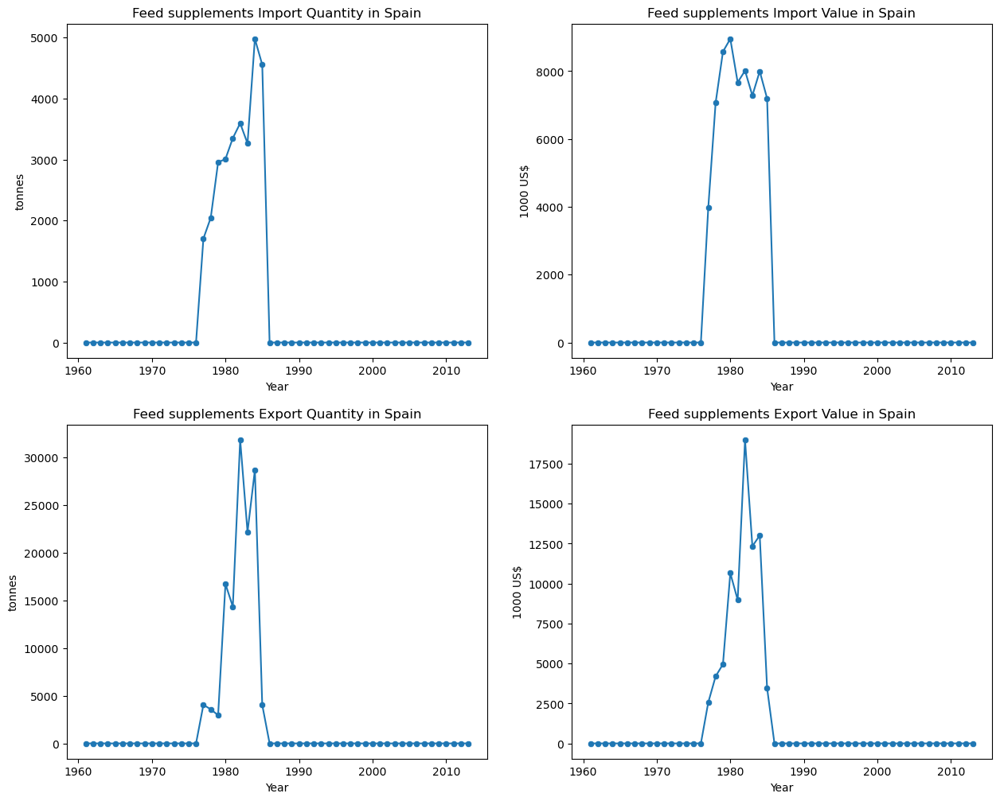

In [86]:
#repeating for trade products
for country in df_TCL['Area'].unique():
    for item in df_TCL['Item'].unique():
        fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))
        for element, ax in zip(df_TCL['Element'].unique(), axs.ravel()):
        #for element in df_TCL['Element'].unique():
                    
            df = df_TCL[df_TCL['Area'] == country]
            df = df[df['Element'] == element]
            
            if item in df['Item'].values:

                sns.lineplot(data=df[df['Item']==item], x='Year', y='Value', ax=ax)
                sns.scatterplot(data=df[df['Item']==item], x='Year', y='Value', ax=ax)
                 
                ax.set_xlabel('Year')
                ax.set_ylabel(df['Unit'].unique()[0])
                ax.set_title(item + ' ' + element + ' in ' + country)
        if item in df['Item'].values:
            #plt.savefig('graphs/'+item+'_trade_'+country+'.png',dpi=300, bbox_inches = "tight")
            plt.show()

Thoughts for ML - pivot rows into columns that are like 'barley area harvested' 'barley yield' etc. and chicken production chicken count. And just have the rows as years. So the dataset might be like 50 rows long and 100 columns wide or something which might make for bad ML, not enought data for variables. But maybe random forest will save me?

# Statistics
I don't know what I'm doing but I'll work it out

In [87]:
#hello again. Making sure I haven't lost my variables
chicken_item = []
grains_item = []
for item in df_QCL['Item'].unique():
    if 'hicken' in item:
        chicken_item.append(item)
    else:
        grains_item.append(item)

In [88]:
#and reminding myself what they say
print('Chicken list: ', chicken_item)
print('Grains list: ', grains_item)

Chicken list:  ['Chickens', 'Meat of chickens, fresh or chilled']
Grains list:  ['Barley', 'Cereals n.e.c.', 'Maize (corn)', 'Mixed grain', 'Oats', 'Soya beans', 'Sunflower seed', 'Wheat', 'Millet']


In [89]:
df_QCL[df_QCL['Item'].isin(chicken_item)]['Element'].unique()

array(['Stocks', 'Yield/Carcass Weight', 'Production',
       'Producing Animals/Slaughtered'], dtype=object)

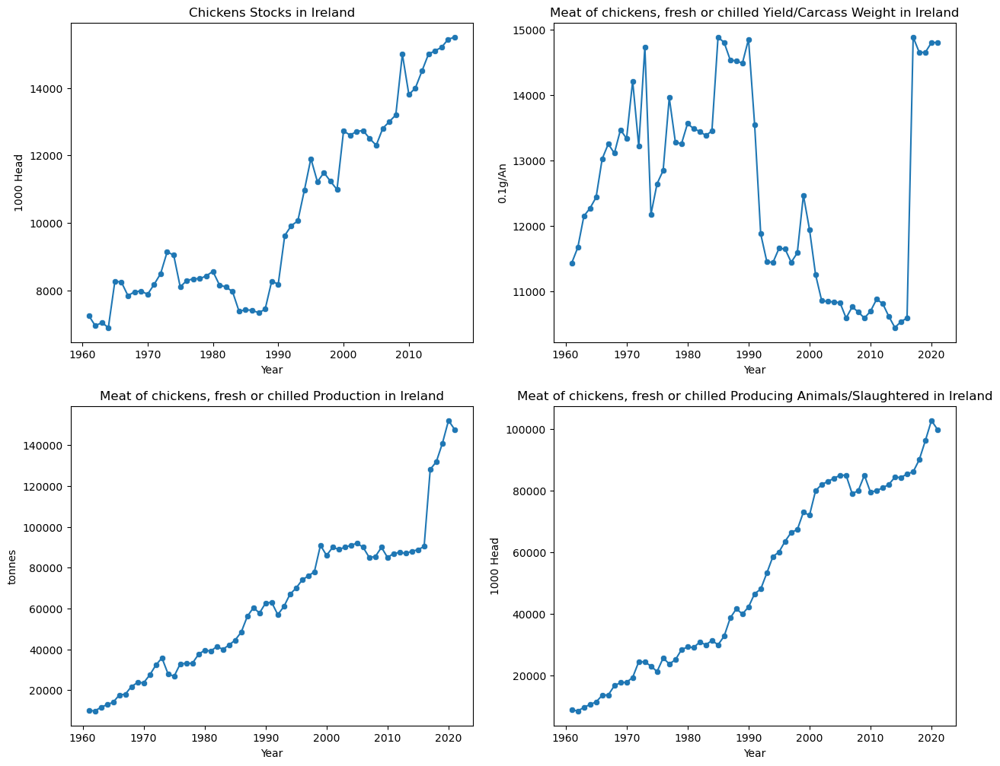

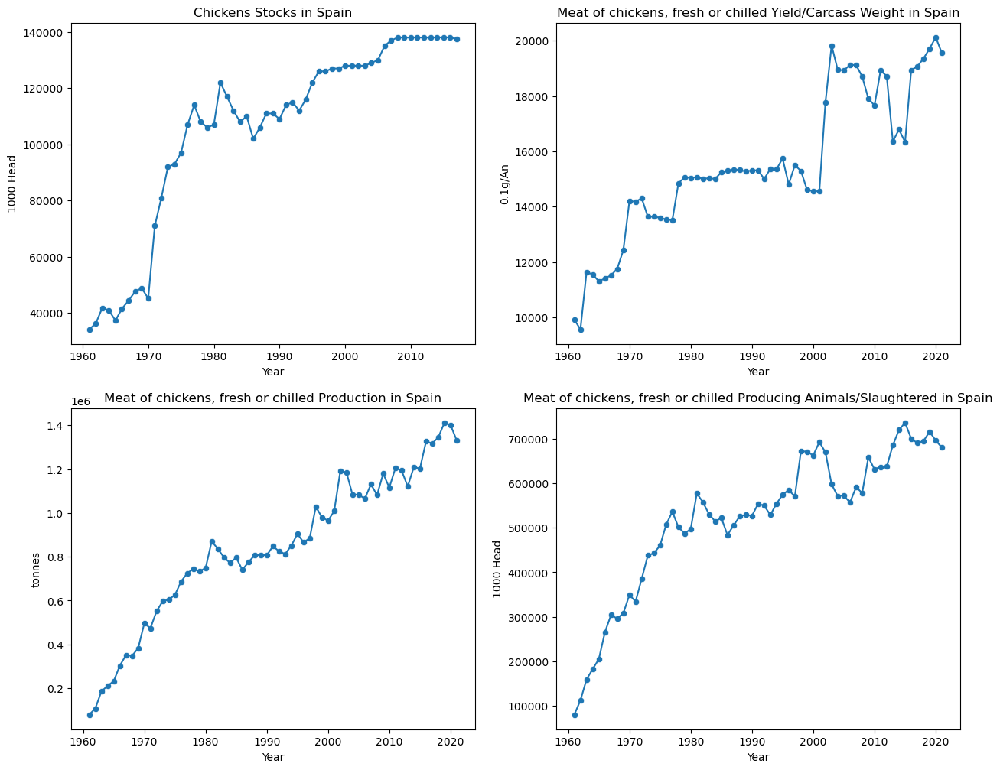

In [90]:
#graphs for just chicken data, Ireland and Spain
#Really should have made a function for this but I hadn't expected to be reusing this code so much

for country in df_QCL['Area'].unique(): #ireland and spain
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))
    for element, ax in zip(df_QCL[df_QCL['Item'].isin(chicken_item)]['Element'].unique(), axs.ravel()): 
        for item in chicken_item: #chicken, etc.
            
            df = df_QCL[df_QCL['Area'] == country]
            df = df[df['Element'] == element]
            
            if item in df['Item'].values:

                sns.lineplot(data=df[df['Item']==item], x='Year', y='Value', ax=ax)
                sns.scatterplot(data=df[df['Item']==item], x='Year', y='Value', ax=ax)
                
                ax.set_xlabel('Year')
                ax.set_ylabel(df['Unit'].unique()[0])
                ax.set_title(item + ' ' + element + ' in ' + country)
                
    #plt.savefig('graphs/chicken_production_'+country+'.png', dpi=300, bbox_inches = "tight")
    plt.show()

Grab that population dataset so we can do some per capita calculations

In [91]:
df_pop = df_dict['FAOSTAT_data_en_IRL_SPA_annual_population']

In [92]:
df_pop

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,OA,Annual population,372,Ireland,511,Total Population - Both sexes,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,2906.599,X,Figure from international organizations,NaN
1,OA,Annual population,372,Ireland,512,Total Population - Male,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1478.504,X,Figure from international organizations,NaN
2,OA,Annual population,372,Ireland,513,Total Population - Female,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1428.096,X,Figure from international organizations,NaN
3,OA,Annual population,372,Ireland,551,Rural population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1745.289,X,Figure from international organizations,NaN
4,OA,Annual population,372,Ireland,561,Urban population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1167.804,X,Figure from international organizations,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,OA,Annual population,724,Spain,511,Total Population - Both sexes,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,47486.935,X,Figure from international organizations,NaN
716,OA,Annual population,724,Spain,512,Total Population - Male,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,23271.722,X,Figure from international organizations,NaN
717,OA,Annual population,724,Spain,513,Total Population - Female,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,24215.213,X,Figure from international organizations,NaN
718,OA,Annual population,724,Spain,551,Rural population,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,8799.411,X,Figure from international organizations,NaN


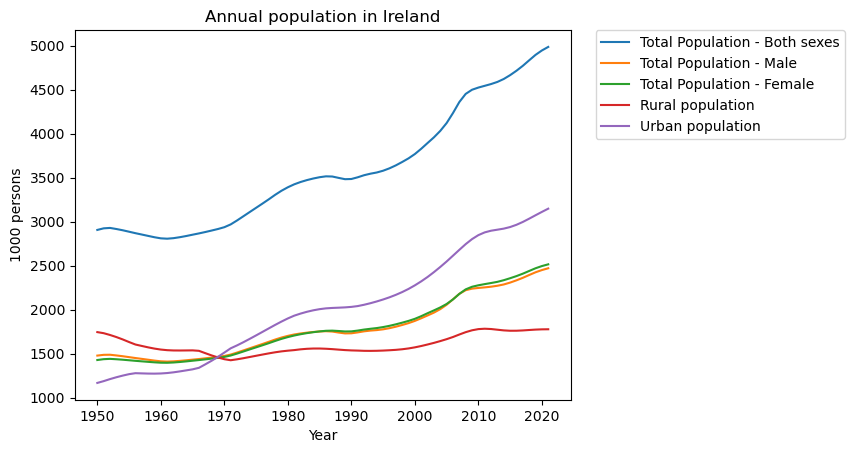

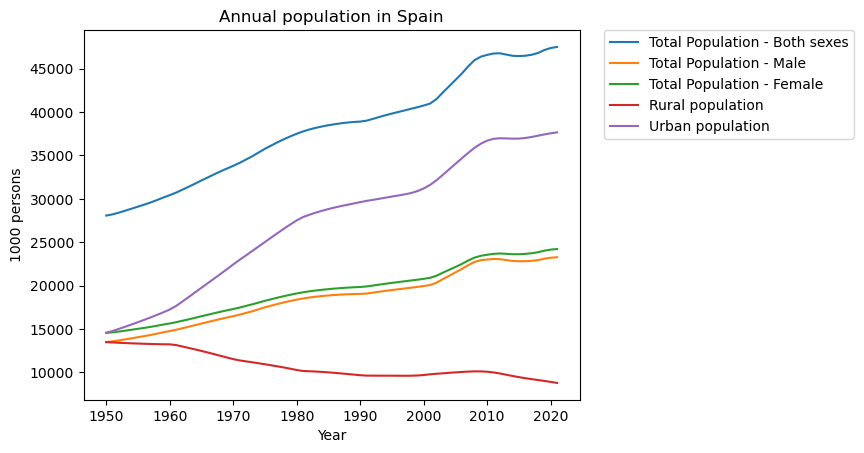

In [93]:
for country in df_pop['Area'].unique(): #ireland and spain
    
    df = df_pop[df_pop['Area'] == country]
    
    sns.lineplot(data=df, x='Year', y='Value', hue='Element')
    #sns.scatterplot(data=df, x='Year', y='Value', hue='Element')

    plt.xlabel('Year')
    plt.ylabel(df['Unit'].unique()[0])
    plt.title('Annual population in ' + country)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    #plt.savefig('graphs/annual_population_'+country+'.png', dpi=300, bbox_inches = "tight")
    plt.show()

Back to thinking about the crop and livestock products

In [94]:
print(df_QCL['Element'].unique(), df_QCL['Item'].unique())

['Area harvested' 'Yield' 'Production' 'Stocks' 'Yield/Carcass Weight'
 'Producing Animals/Slaughtered'] ['Barley' 'Cereals n.e.c.' 'Chickens' 'Maize (corn)'
 'Meat of chickens, fresh or chilled' 'Mixed grain' 'Oats' 'Soya beans'
 'Sunflower seed' 'Wheat' 'Millet']


In [95]:
df_Qirl = df_QCL[df_QCL['Area'] == 'Ireland']
df_Qirl

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1961,1961-01-01,ha,146373.0,A,Official figure
1,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1962,1962-01-01,ha,164219.0,A,Official figure
2,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1963,1963-01-01,ha,173608.0,A,Official figure
3,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1964,1964-01-01,ha,183644.0,A,Official figure
4,QCL,Crops and livestock products,372,Ireland,5312,Area harvested,115.0,Barley,1965,1965-01-01,ha,187790.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
893,QCL,Crops and livestock products,372,Ireland,5510,Production,111.0,Wheat,2017,2017-01-01,tonnes,681679.0,A,Official figure
894,QCL,Crops and livestock products,372,Ireland,5510,Production,111.0,Wheat,2018,2018-01-01,tonnes,485480.0,A,Official figure
895,QCL,Crops and livestock products,372,Ireland,5510,Production,111.0,Wheat,2019,2019-01-01,tonnes,595360.0,A,Official figure
896,QCL,Crops and livestock products,372,Ireland,5510,Production,111.0,Wheat,2020,2020-01-01,tonnes,364920.0,A,Official figure


In [96]:
df_Qirl['Item'].unique()

array(['Barley', 'Cereals n.e.c.', 'Chickens', 'Maize (corn)',
       'Meat of chickens, fresh or chilled', 'Mixed grain', 'Oats',
       'Soya beans', 'Sunflower seed', 'Wheat'], dtype=object)

In [97]:
unwanted = ['Mixed grain', 'Cereals n.e.c.','Maize (corn)','Soya beans', 'Sunflower seed']

In [98]:
df_Qirl = df_Qirl[~df_Qirl['Item'].isin(unwanted)]

In [99]:
wanted = df_Qirl['Item'].unique()
wanted # for consistency in the spanish dataset. Or maybe it doesn't matter? 

array(['Barley', 'Chickens', 'Meat of chickens, fresh or chilled', 'Oats',
       'Wheat'], dtype=object)

In [100]:
df_Qirl['Item Element'] = df_Qirl['Item'] +' ' + df_Qirl['Element'] + ' ' + df_Qirl['Unit'] #I don't know why this is wrong? Is there more approriate way to concat strings across columns?

C:\Users\Juliet\AppData\Local\Temp\ipykernel_7420\2802644559.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Qirl['Item Element'] = df_Qirl['Item'] +' ' + df_Qirl['Element'] + ' ' + df_Qirl['Unit'] #I don't know why this is wrong? Is there more approriate way to concat strings across columns?


In [101]:
df_Qirl_pivot = df_Qirl.pivot(index='Year', columns='Item Element')['Value']

In [102]:
df_Qirl_pivot #very cool

Item Element,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha
Year,,,,,,,,,,,,,
1961-01-01,146373.0,515400.0,35211.0,7258.0,8750.0,10000.0,11429.0,148800.0,381400.0,25632.0,139534.0,469900.0,33676.0
1962-01-01,164219.0,603200.0,36731.0,6954.0,8400.0,9800.0,11667.0,140000.0,396000.0,28286.0,127069.0,439000.0,34548.0
1963-01-01,173608.0,588900.0,33921.0,7050.0,9550.0,11600.0,12147.0,134200.0,368300.0,27444.0,94169.0,300600.0,31921.0
1964-01-01,183644.0,550699.0,29987.0,6902.0,10500.0,12880.0,12267.0,116700.0,312700.0,26795.0,86763.0,271600.0,31304.0
1965-01-01,187790.0,615730.0,32788.0,8276.0,11300.0,14050.0,12434.0,115088.0,324269.0,28176.0,73720.0,232660.0,31560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,180186.0,1505811.0,83570.0,15504.0,86116.0,128170.0,14883.0,24443.0,205049.0,83889.0,67047.0,681679.0,101672.0
2018-01-01,185210.0,1181560.0,63796.0,NaN,90059.0,131940.0,14650.0,17780.0,117860.0,66288.0,57980.0,485480.0,83732.0
2019-01-01,179360.0,1479600.0,82493.0,NaN,96247.0,141000.0,14650.0,23820.0,193030.0,81037.0,63480.0,595360.0,93787.0


I was so lost as to why the chicken stocks value were so much lower than Meat of chickens, fresh or chilled Producing Animals/Slaughtered when they were both in units of 1000 head but I looked into it.

*There could be a variety of reasons why the number of chicken stocks (i.e. the number of chickens being raised) in a country might be lower than the number of animals slaughtered for meat production. Here are a few possible explanations:*

1.    Some of the chickens being slaughtered may have been imported from other countries. If a country is importing more chickens than it is raising domestically, the number of chicken stocks may be lower than the number of animals slaughtered.

2.    Chickens have a relatively short lifespan compared to other livestock animals such as cattle or pigs. This means that a higher percentage of the chicken population may be slaughtered for meat each year, resulting in a lower overall chicken stock.

3.    Chickens may be raised in intensive, high-density poultry operations, which can result in a larger number of animals being slaughtered relative to the number of chickens being raised at any given time.

4.    Some chickens may be raised specifically for egg production rather than meat, and may not be included in the statistics on animals slaughtered for meat.

*It's also worth noting that the relationship between animal stocks and slaughter rates can vary depending on the specific country and the type of animal being considered.*

So, my understanding is that chicken stocks is giving the average number of chickens alive at any one time during the year in question. However, chickens producing animals/slaughter 1000 head is giving the number of chickens slaughter in a given year, total. As broiler chickens are generally slaughtered between 4 and 16 weeks (https://en.wikipedia.org/wiki/Broiler, need a better citation) that is a huge amount of turnover. Teagasc claims that in Ireland, 70 million broilers are slaughtered a year, 4 million turkeys, and that the egg laying stocks stay around 2 million (https://www.teagasc.ie/rural-economy/rural-development/poultry/). Let's double check their claims, but it gives a ballpark understanding of the landscape of poultry farming in Ireland. The FAO data does not differentiate between egg laying stock and meat stock in their chicken stocks values, and given that we don't know the rate of turnover of chickens slaughtered, we can't calculate the egg laying stock using the meat producing animals slaughtered value. So I'm probably just going to focus on animals slaughtered annually.

In [103]:
df_pop[df_pop['Area']=='Ireland']

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value,Flag,Flag Description,Note
0,OA,Annual population,372,Ireland,511,Total Population - Both sexes,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,2906.599,X,Figure from international organizations,NaN
1,OA,Annual population,372,Ireland,512,Total Population - Male,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1478.504,X,Figure from international organizations,NaN
2,OA,Annual population,372,Ireland,513,Total Population - Female,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1428.096,X,Figure from international organizations,NaN
3,OA,Annual population,372,Ireland,551,Rural population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1745.289,X,Figure from international organizations,NaN
4,OA,Annual population,372,Ireland,561,Urban population,3010,Population - Est. & Proj.,1950,1950-01-01,1000 persons,1167.804,X,Figure from international organizations,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,OA,Annual population,372,Ireland,511,Total Population - Both sexes,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,4986.526,X,Figure from international organizations,NaN
356,OA,Annual population,372,Ireland,512,Total Population - Male,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,2470.919,X,Figure from international organizations,NaN
357,OA,Annual population,372,Ireland,513,Total Population - Female,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,2515.607,X,Figure from international organizations,NaN
358,OA,Annual population,372,Ireland,551,Rural population,3010,Population - Est. & Proj.,2021,2021-01-01,1000 persons,1777.637,X,Figure from international organizations,NaN


In [104]:
df_pop_irl_pivot = df_pop[df_pop['Area']=='Ireland'].pivot(index='Year', columns='Element', values='Value')

In [105]:
df_pop_irl_pivot

Element,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population
Year,,,,,
1950-01-01,1745.289,2906.599,1428.096,1478.504,1167.804
1951-01-01,1733.015,2924.705,1437.685,1487.021,1188.094
1952-01-01,1712.709,2929.379,1441.256,1488.122,1211.345
1953-01-01,1689.040,2917.037,1436.907,1480.130,1232.315
1954-01-01,1662.071,2902.780,1431.583,1471.197,1250.974
...,...,...,...,...,...
2017-01-01,1764.335,4771.854,2409.471,2362.383,2997.322
2018-01-01,1769.220,4834.507,2440.194,2394.313,3034.528
2019-01-01,1773.798,4896.019,2470.880,2425.139,3073.341


In [106]:
df_irl_merged = pd.merge(df_pop_irl_pivot, df_Qirl_pivot, on='Year') #so I can do those per capita calculations

In [107]:
df_irl_merged

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha
Year,,,,,,,,,,,,,,,,,,
1961-01-01,1539.928,2807.005,1396.739,1410.265,1280.110,146373.0,515400.0,35211.0,7258.0,8750.0,10000.0,11429.0,148800.0,381400.0,25632.0,139534.0,469900.0,33676.0
1962-01-01,1536.686,2813.067,1400.138,1412.929,1288.262,164219.0,603200.0,36731.0,6954.0,8400.0,9800.0,11667.0,140000.0,396000.0,28286.0,127069.0,439000.0,34548.0
1963-01-01,1536.216,2824.089,1405.725,1418.364,1298.803,173608.0,588900.0,33921.0,7050.0,9550.0,11600.0,12147.0,134200.0,368300.0,27444.0,94169.0,300600.0,31921.0
1964-01-01,1536.905,2837.436,1412.455,1424.982,1310.435,183644.0,550699.0,29987.0,6902.0,10500.0,12880.0,12267.0,116700.0,312700.0,26795.0,86763.0,271600.0,31304.0
1965-01-01,1537.713,2852.401,1420.136,1432.265,1322.242,187790.0,615730.0,32788.0,8276.0,11300.0,14050.0,12434.0,115088.0,324269.0,28176.0,73720.0,232660.0,31560.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,1764.335,4771.854,2409.471,2362.383,2997.322,180186.0,1505811.0,83570.0,15504.0,86116.0,128170.0,14883.0,24443.0,205049.0,83889.0,67047.0,681679.0,101672.0
2018-01-01,1769.220,4834.507,2440.194,2394.313,3034.528,185210.0,1181560.0,63796.0,NaN,90059.0,131940.0,14650.0,17780.0,117860.0,66288.0,57980.0,485480.0,83732.0
2019-01-01,1773.798,4896.019,2470.880,2425.139,3073.341,179360.0,1479600.0,82493.0,NaN,96247.0,141000.0,14650.0,23820.0,193030.0,81037.0,63480.0,595360.0,93787.0


In [108]:
#chickens (animal numbers) killed per person in Ireland
df_irl_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person'] = df_irl_merged['Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head'] / df_irl_merged['Total Population - Both sexes']

In [109]:
#chicken kg per person in Ireland
df_irl_merged['Meat of chickens, fresh or chilled Production per capita kg/person'] = df_irl_merged['Meat of chickens, fresh or chilled Production tonnes'] / df_irl_merged['Total Population - Both sexes']

In [110]:
df_irl_merged

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha,Meat of chicken Producing Animals/Slaughtered per capita head/person,"Meat of chickens, fresh or chilled Production per capita kg/person"
Year,,,,,,,,,,,,,,,,,,,,
1961-01-01,1539.928,2807.005,1396.739,1410.265,1280.110,146373.0,515400.0,35211.0,7258.0,8750.0,10000.0,11429.0,148800.0,381400.0,25632.0,139534.0,469900.0,33676.0,3.117201,3.562516
1962-01-01,1536.686,2813.067,1400.138,1412.929,1288.262,164219.0,603200.0,36731.0,6954.0,8400.0,9800.0,11667.0,140000.0,396000.0,28286.0,127069.0,439000.0,34548.0,2.986065,3.483742
1963-01-01,1536.216,2824.089,1405.725,1418.364,1298.803,173608.0,588900.0,33921.0,7050.0,9550.0,11600.0,12147.0,134200.0,368300.0,27444.0,94169.0,300600.0,31921.0,3.381621,4.107519
1964-01-01,1536.905,2837.436,1412.455,1424.982,1310.435,183644.0,550699.0,29987.0,6902.0,10500.0,12880.0,12267.0,116700.0,312700.0,26795.0,86763.0,271600.0,31304.0,3.700524,4.539309
1965-01-01,1537.713,2852.401,1420.136,1432.265,1322.242,187790.0,615730.0,32788.0,8276.0,11300.0,14050.0,12434.0,115088.0,324269.0,28176.0,73720.0,232660.0,31560.0,3.961575,4.925675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,1764.335,4771.854,2409.471,2362.383,2997.322,180186.0,1505811.0,83570.0,15504.0,86116.0,128170.0,14883.0,24443.0,205049.0,83889.0,67047.0,681679.0,101672.0,18.046654,26.859581
2018-01-01,1769.220,4834.507,2440.194,2394.313,3034.528,185210.0,1181560.0,63796.0,NaN,90059.0,131940.0,14650.0,17780.0,117860.0,66288.0,57980.0,485480.0,83732.0,18.628373,27.291304
2019-01-01,1773.798,4896.019,2470.880,2425.139,3073.341,179360.0,1479600.0,82493.0,NaN,96247.0,141000.0,14650.0,23820.0,193030.0,81037.0,63480.0,595360.0,93787.0,19.658216,28.798908


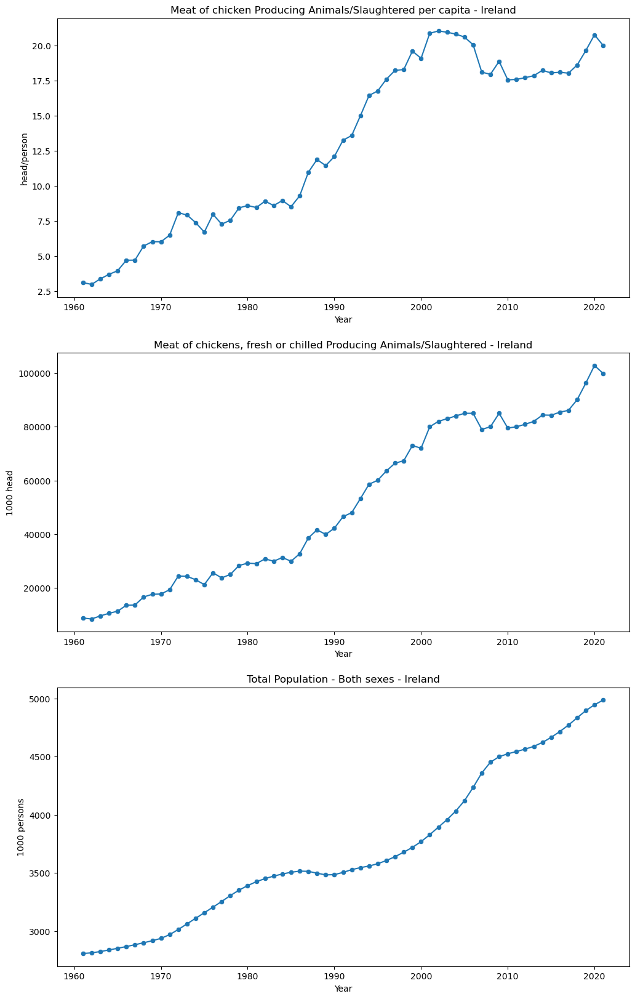

In [111]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 20))
ax1, ax2, ax3 = axs.ravel()

sns.lineplot(data=df_irl_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
sns.scatterplot(data=df_irl_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
ax1.set_title('Meat of chicken Producing Animals/Slaughtered per capita - Ireland')
ax1.set_xlabel('Year')
ax1.set_ylabel('head/person')
#plt.show()

sns.lineplot(data=df_irl_merged, x='Year', y='Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head', ax=ax2)
sns.scatterplot(data=df_irl_merged, x='Year', y='Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head', ax=ax2)
ax2.set_title('Meat of chickens, fresh or chilled Producing Animals/Slaughtered - Ireland')
ax2.set_xlabel('Year')
ax2.set_ylabel('1000 head')
#plt.show()

sns.lineplot(data=df_irl_merged, x='Year', y='Total Population - Both sexes', ax=ax3)
sns.scatterplot(data=df_irl_merged, x='Year', y='Total Population - Both sexes', ax=ax3)
ax3.set_title('Total Population - Both sexes - Ireland')
ax3.set_xlabel('Year')
ax3.set_ylabel('1000 persons')

#plt.savefig('graphs/chicken_per_capita_ireland.png', dpi=300, bbox_inches = "tight")
plt.show()

Now to copy everything I did above. What a waste.
### Spain

In [112]:
df_Qspa = df_QCL[df_QCL['Area'] == 'Spain']
df_Qspa

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
898,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1961,1961-01-01,ha,1450000.0,A,Official figure
899,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1962,1962-01-01,ha,1449395.0,A,Official figure
900,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1963,1963-01-01,ha,1447100.0,A,Official figure
901,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1964,1964-01-01,ha,1381000.0,A,Official figure
902,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1965,1965-01-01,ha,1374410.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2653,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2017,2017-01-01,tonnes,4875957.0,A,Official figure
2654,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2018,2018-01-01,tonnes,8322510.0,A,Official figure
2655,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2019,2019-01-01,tonnes,6041170.0,A,Official figure
2656,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2020,2020-01-01,tonnes,8143510.0,A,Official figure


In [113]:
df_Qspa['Item'].unique()

array(['Barley', 'Cereals n.e.c.', 'Chickens', 'Maize (corn)',
       'Meat of chickens, fresh or chilled', 'Millet', 'Mixed grain',
       'Oats', 'Soya beans', 'Sunflower seed', 'Wheat'], dtype=object)

In [114]:
df_Qspa = df_Qspa[df_Qspa['Item'].isin(wanted)]

In [115]:
df_Qspa['Item Element'] = df_Qspa['Item'] +' ' + df_Qspa['Element'] + ' ' + df_Qspa['Unit']

C:\Users\Juliet\AppData\Local\Temp\ipykernel_7420\3428017544.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Qspa['Item Element'] = df_Qspa['Item'] +' ' + df_Qspa['Element'] + ' ' + df_Qspa['Unit']


In [116]:
df_Qspa #those few cells should have been done on the common df_QCL and then I should have split it by country before the pivot

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Item Element
898,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1961,1961-01-01,ha,1450000.0,A,Official figure,Barley Area harvested ha
899,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1962,1962-01-01,ha,1449395.0,A,Official figure,Barley Area harvested ha
900,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1963,1963-01-01,ha,1447100.0,A,Official figure,Barley Area harvested ha
901,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1964,1964-01-01,ha,1381000.0,A,Official figure,Barley Area harvested ha
902,QCL,Crops and livestock products,724,Spain,5312,Area harvested,115.0,Barley,1965,1965-01-01,ha,1374410.0,A,Official figure,Barley Area harvested ha
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2653,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2017,2017-01-01,tonnes,4875957.0,A,Official figure,Wheat Production tonnes
2654,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2018,2018-01-01,tonnes,8322510.0,A,Official figure,Wheat Production tonnes
2655,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2019,2019-01-01,tonnes,6041170.0,A,Official figure,Wheat Production tonnes
2656,QCL,Crops and livestock products,724,Spain,5510,Production,111.0,Wheat,2020,2020-01-01,tonnes,8143510.0,A,Official figure,Wheat Production tonnes


In [117]:
df_Qspa_pivot = df_Qspa.pivot(index='Year', columns='Item Element')['Value']

In [118]:
df_Qspa_pivot

Item Element,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha
Year,,,,,,,,,,,,,
1961-01-01,1450000.0,1743700.0,12026.0,34210.0,79800.0,79100.00,9912.0,582900.0,494900.0,8490.0,3890605.0,3438000.0,8837.0
1962-01-01,1449395.0,2161952.0,14916.0,36248.0,112100.0,107200.00,9563.0,548945.0,512953.0,9344.0,4262540.0,4819545.0,11307.0
1963-01-01,1447100.0,2070700.0,14309.0,41822.0,159000.0,185000.00,11635.0,527263.0,465700.0,8832.0,4247015.0,4865360.0,11456.0
1964-01-01,1381000.0,1926900.0,13953.0,40973.0,182350.0,210600.00,11549.0,508545.0,389567.0,7660.0,4143000.0,3981000.0,9609.0
1965-01-01,1374410.0,1891447.0,13762.0,37368.0,204750.0,231400.00,11302.0,501624.0,369700.0,7370.0,4260000.0,4719000.0,11077.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,2597527.0,5785944.0,22275.0,137500.0,690837.0,1317486.64,19071.0,558767.0,843259.0,15091.0,2096058.0,4875957.0,23263.0
2018-01-01,2569460.0,9554160.0,37184.0,NaN,695196.0,1345690.00,19357.0,556500.0,1547460.0,27807.0,2063680.0,8322510.0,40328.0
2019-01-01,2693510.0,7744150.0,28751.0,NaN,716259.0,1412220.00,19717.0,453430.0,841200.0,18552.0,1920090.0,6041170.0,31463.0


In [119]:
df_pop_spa_pivot = df_pop[df_pop['Area']=='Spain'].pivot(index='Year', columns='Element', values='Value')

In [120]:
df_pop_spa_pivot

Element,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population
Year,,,,,
1950-01-01,13496.009,28069.694,14562.633,13507.060,14573.726
1951-01-01,13462.062,28207.080,14621.762,13585.318,14781.573
1952-01-01,13422.112,28404.771,14712.631,13692.140,15020.261
1953-01-01,13389.000,28633.539,14817.408,13816.130,15269.669
1954-01-01,13359.555,28862.377,14923.124,13939.254,15527.794
...,...,...,...,...,...
2017-01-01,9233.918,46584.170,23729.720,22854.449,37120.403
2018-01-01,9130.380,46792.043,23848.825,22943.218,37267.072
2019-01-01,9025.938,47131.372,24028.434,23102.938,37415.111


In [121]:
df_spa_merged = pd.merge(df_pop_spa_pivot, df_Qspa_pivot, on='Year')

In [122]:
df_spa_merged

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha
Year,,,,,,,,,,,,,,,,,,
1961-01-01,13158.081,30711.863,15788.245,14923.619,17659.489,1450000.0,1743700.0,12026.0,34210.0,79800.0,79100.00,9912.0,582900.0,494900.0,8490.0,3890605.0,3438000.0,8837.0
1962-01-01,12993.319,31052.630,15955.797,15096.834,18171.756,1449395.0,2161952.0,14916.0,36248.0,112100.0,107200.00,9563.0,548945.0,512953.0,9344.0,4262540.0,4819545.0,11307.0
1963-01-01,12828.537,31388.554,16120.695,15267.858,18695.848,1447100.0,2070700.0,14309.0,41822.0,159000.0,185000.00,11635.0,527263.0,465700.0,8832.0,4247015.0,4865360.0,11456.0
1964-01-01,12659.259,31747.643,16297.975,15449.668,19226.145,1381000.0,1926900.0,13953.0,40973.0,182350.0,210600.00,11549.0,508545.0,389567.0,7660.0,4143000.0,3981000.0,9609.0
1965-01-01,12484.310,32112.015,16477.720,15634.294,19756.731,1374410.0,1891447.0,13762.0,37368.0,204750.0,231400.00,11302.0,501624.0,369700.0,7370.0,4260000.0,4719000.0,11077.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,9233.918,46584.170,23729.720,22854.449,37120.403,2597527.0,5785944.0,22275.0,137500.0,690837.0,1317486.64,19071.0,558767.0,843259.0,15091.0,2096058.0,4875957.0,23263.0
2018-01-01,9130.380,46792.043,23848.825,22943.218,37267.072,2569460.0,9554160.0,37184.0,NaN,695196.0,1345690.00,19357.0,556500.0,1547460.0,27807.0,2063680.0,8322510.0,40328.0
2019-01-01,9025.938,47131.372,24028.434,23102.938,37415.111,2693510.0,7744150.0,28751.0,NaN,716259.0,1412220.00,19717.0,453430.0,841200.0,18552.0,1920090.0,6041170.0,31463.0


In [123]:
df_spa_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person'] = df_spa_merged['Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head'] / df_spa_merged['Total Population - Both sexes']

In [124]:
#chicken kg per person in Spain
df_spa_merged['Meat of chickens, fresh or chilled Production per capita kg/person'] = df_spa_merged['Meat of chickens, fresh or chilled Production tonnes'] / df_spa_merged['Total Population - Both sexes']

In [125]:
df_spa_merged

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head","Meat of chickens, fresh or chilled Production tonnes","Meat of chickens, fresh or chilled Yield/Carcass Weight 0.1g/An",Oats Area harvested ha,Oats Production tonnes,Oats Yield hg/ha,Wheat Area harvested ha,Wheat Production tonnes,Wheat Yield hg/ha,Meat of chicken Producing Animals/Slaughtered per capita head/person,"Meat of chickens, fresh or chilled Production per capita kg/person"
Year,,,,,,,,,,,,,,,,,,,,
1961-01-01,13158.081,30711.863,15788.245,14923.619,17659.489,1450000.0,1743700.0,12026.0,34210.0,79800.0,79100.00,9912.0,582900.0,494900.0,8490.0,3890605.0,3438000.0,8837.0,2.598344,2.575552
1962-01-01,12993.319,31052.630,15955.797,15096.834,18171.756,1449395.0,2161952.0,14916.0,36248.0,112100.0,107200.00,9563.0,548945.0,512953.0,9344.0,4262540.0,4819545.0,11307.0,3.610000,3.452204
1963-01-01,12828.537,31388.554,16120.695,15267.858,18695.848,1447100.0,2070700.0,14309.0,41822.0,159000.0,185000.00,11635.0,527263.0,465700.0,8832.0,4247015.0,4865360.0,11456.0,5.065541,5.893868
1964-01-01,12659.259,31747.643,16297.975,15449.668,19226.145,1381000.0,1926900.0,13953.0,40973.0,182350.0,210600.00,11549.0,508545.0,389567.0,7660.0,4143000.0,3981000.0,9609.0,5.743733,6.633563
1965-01-01,12484.310,32112.015,16477.720,15634.294,19756.731,1374410.0,1891447.0,13762.0,37368.0,204750.0,231400.00,11302.0,501624.0,369700.0,7370.0,4260000.0,4719000.0,11077.0,6.376118,7.206026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,9233.918,46584.170,23729.720,22854.449,37120.403,2597527.0,5785944.0,22275.0,137500.0,690837.0,1317486.64,19071.0,558767.0,843259.0,15091.0,2096058.0,4875957.0,23263.0,14.829866,28.281853
2018-01-01,9130.380,46792.043,23848.825,22943.218,37267.072,2569460.0,9554160.0,37184.0,NaN,695196.0,1345690.00,19357.0,556500.0,1547460.0,27807.0,2063680.0,8322510.0,40328.0,14.857141,28.758949
2019-01-01,9025.938,47131.372,24028.434,23102.938,37415.111,2693510.0,7744150.0,28751.0,NaN,716259.0,1412220.00,19717.0,453430.0,841200.0,18552.0,1920090.0,6041170.0,31463.0,15.197075,29.963482


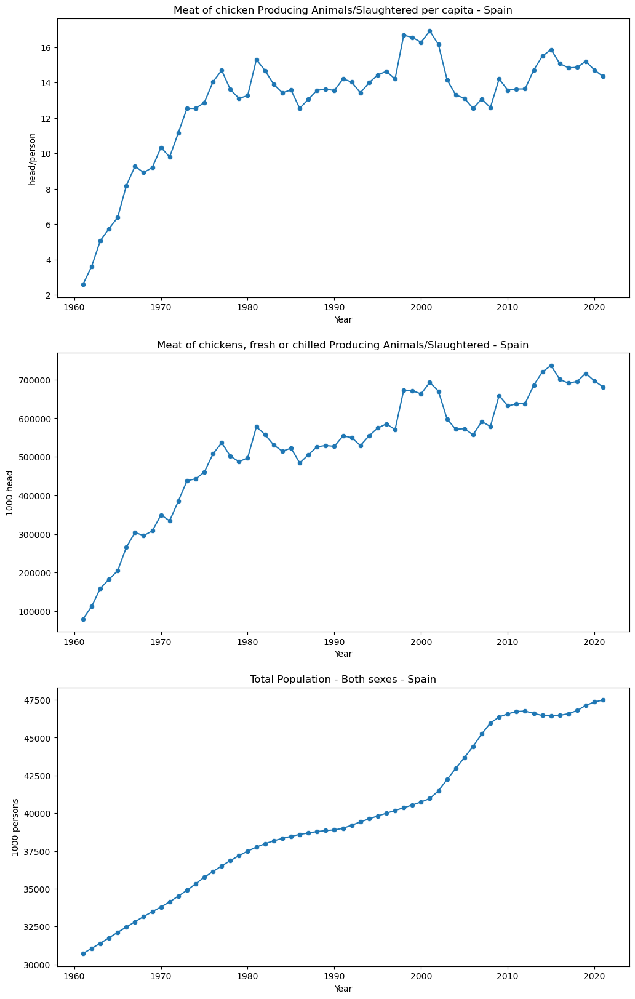

In [126]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 20))
ax1, ax2, ax3 = axs.ravel()

sns.lineplot(data=df_spa_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
sns.scatterplot(data=df_spa_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
ax1.set_title('Meat of chicken Producing Animals/Slaughtered per capita - Spain')
ax1.set_xlabel('Year')
ax1.set_ylabel('head/person')
#plt.show()

sns.lineplot(data=df_spa_merged, x='Year', y='Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head', ax=ax2)
sns.scatterplot(data=df_spa_merged, x='Year', y='Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head', ax=ax2)
ax2.set_title('Meat of chickens, fresh or chilled Producing Animals/Slaughtered - Spain')
ax2.set_xlabel('Year')
ax2.set_ylabel('1000 head')
#plt.show()

sns.lineplot(data=df_spa_merged, x='Year', y='Total Population - Both sexes', ax=ax3)
sns.scatterplot(data=df_spa_merged, x='Year', y='Total Population - Both sexes', ax=ax3)
ax3.set_title('Total Population - Both sexes - Spain')
ax3.set_xlabel('Year')
ax3.set_ylabel('1000 persons')

#plt.savefig('graphs/chicken_per_capita_spain.png', dpi=300, bbox_inches = "tight")
plt.show()

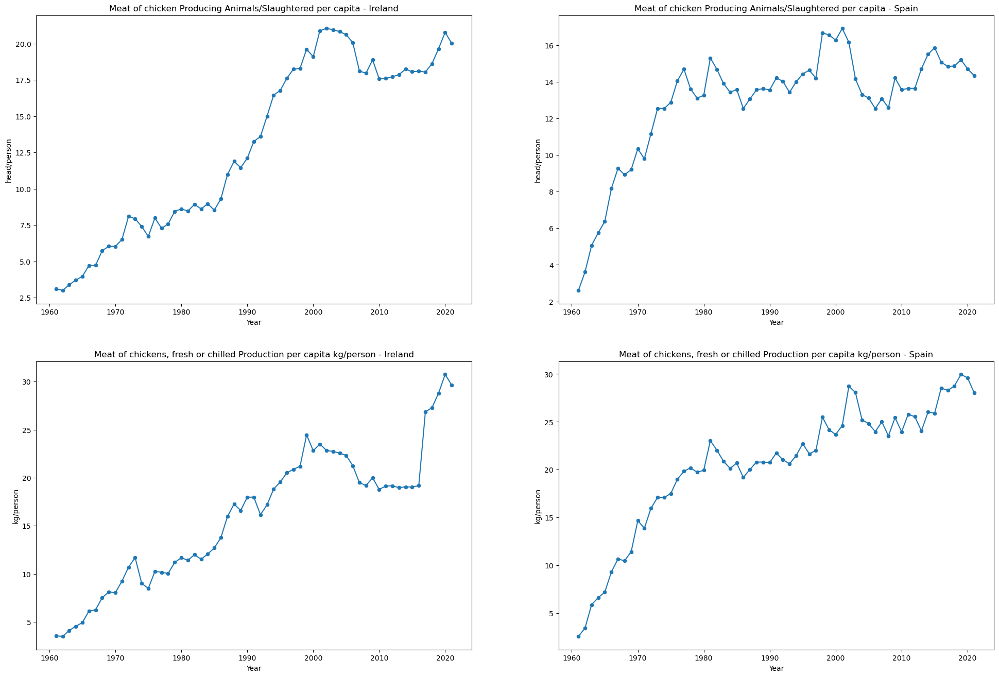

In [127]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(24, 16))
ax1, ax2, ax3, ax4 = axs.ravel()

sns.lineplot(data=df_irl_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
sns.scatterplot(data=df_irl_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax1)
ax1.set_title('Meat of chicken Producing Animals/Slaughtered per capita - Ireland')
ax1.set_xlabel('Year')
ax1.set_ylabel('head/person')

sns.lineplot(data=df_spa_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax2)
sns.scatterplot(data=df_spa_merged, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person', ax=ax2)
ax2.set_title('Meat of chicken Producing Animals/Slaughtered per capita - Spain')
ax2.set_xlabel('Year')
ax2.set_ylabel('head/person')

sns.lineplot(data=df_irl_merged, x='Year', y='Meat of chickens, fresh or chilled Production per capita kg/person', ax=ax3)
sns.scatterplot(data=df_irl_merged, x='Year', y='Meat of chickens, fresh or chilled Production per capita kg/person', ax=ax3)
ax3.set_title('Meat of chickens, fresh or chilled Production per capita kg/person - Ireland')
ax3.set_xlabel('Year')
ax3.set_ylabel('kg/person')

sns.lineplot(data=df_spa_merged, x='Year', y='Meat of chickens, fresh or chilled Production per capita kg/person', ax=ax4)
sns.scatterplot(data=df_spa_merged, x='Year', y='Meat of chickens, fresh or chilled Production per capita kg/person', ax=ax4)
ax4.set_title('Meat of chickens, fresh or chilled Production per capita kg/person - Spain')
ax4.set_xlabel('Year')
ax4.set_ylabel('kg/person')

#plt.savefig('graphs/chicken_per_capita_ireland_spain_2x2.png', dpi=300, bbox_inches = "tight")
plt.show()

It's interesting because Spanish consumption per capita is increasing until around the mid 70s (note Spanish fascist dictator Francisco Franco died in 1975), after which spain shows a somewhat leveling out of number of chickens slaughtered per capita, whereas Ireland has shown a clear increase of chickens killed per capita all the way through to 2000, where it appears to have somewhat leveled out over the last twenty years. We love chicken here in Ireland?

In [128]:
#ireland chicken per capita basic stats
df_irl_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person'].describe()

count    61.000000
mean     12.949125
std       6.006387
min       2.986065
25%       7.935930
50%      13.267500
75%      18.249248
max      21.056643
Name: Meat of chicken Producing Animals/Slaughtered per capita head/person, dtype: float64

In [129]:
#spain chicken per capita basic stats
df_spa_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person'].describe()

count    61.000000
mean     12.859365
std       3.091291
min       2.598344
25%      12.543646
50%      13.603526
75%      14.677948
max      16.912376
Name: Meat of chicken Producing Animals/Slaughtered per capita head/person, dtype: float64

In [130]:
df_irl_merged['Meat of chickens, fresh or chilled Production per capita kg/person'].describe()

count    61.000000
mean     15.910569
std       6.981221
min       3.483742
25%      10.256561
50%      17.266862
75%      20.517211
max      30.759470
Name: Meat of chickens, fresh or chilled Production per capita kg/person, dtype: float64

In [131]:
df_spa_merged['Meat of chickens, fresh or chilled Production per capita kg/person'].describe()

count    61.000000
mean     20.482531
std       6.598241
min       2.575552
25%      18.998832
50%      21.472085
75%      24.997490
max      29.963482
Name: Meat of chickens, fresh or chilled Production per capita kg/person, dtype: float64

In [132]:
ratio = df_irl_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person'] / df_spa_merged['Meat of chicken Producing Animals/Slaughtered per capita head/person']

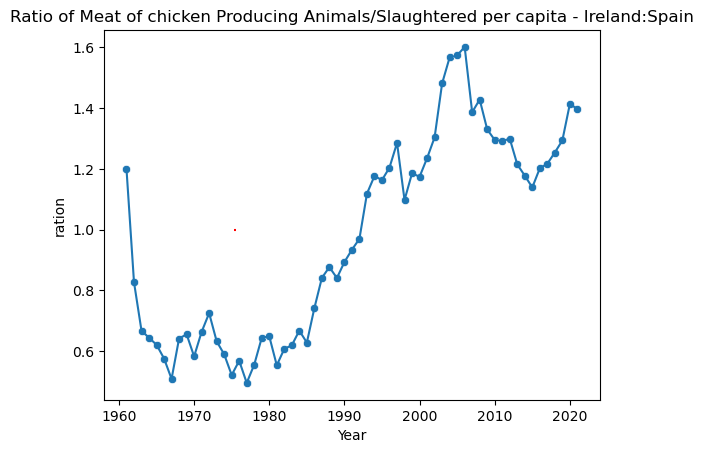

In [133]:
sns.lineplot(data=ratio)#, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person')
sns.scatterplot(data=ratio)#, x='Year', y='Meat of chicken Producing Animals/Slaughtered per capita head/person')
plt.title('Ratio of Meat of chicken Producing Animals/Slaughtered per capita - Ireland:Spain')
plt.hlines(y=1, xmin=1961, xmax=2021, color='r')
plt.xlabel('Year')
plt.ylabel('ration')
plt.show()
#Is this pointless? Anyway, Ireland was killing less chickens per person than spain and then around 1993 we were killing more

In [134]:
df_irl_21cent = df_irl_merged.loc['2000-01-01':pd.Timestamp.today(), ['Meat of chicken Producing Animals/Slaughtered per capita head/person', 'Meat of chickens, fresh or chilled Production per capita kg/person']]
df_irl_21cent

,Meat of chicken Producing Animals/Slaughtered per capita head/person,"Meat of chickens, fresh or chilled Production per capita kg/person"
Year,,
2000-01-01,19.103464,22.818026
2001-01-01,20.893085,23.504721
2002-01-01,21.056643,22.854161
2003-01-01,20.966452,22.734707
2004-01-01,20.833571,22.569702
2005-01-01,20.624981,22.323508
2006-01-01,20.071758,21.252449
2007-01-01,18.119956,19.496155
2008-01-01,17.967870,19.191931


In [135]:
df_spa_21cent = df_spa_merged.loc['2000-01-01':pd.Timestamp.today(), ['Meat of chicken Producing Animals/Slaughtered per capita head/person', 'Meat of chickens, fresh or chilled Production per capita kg/person']]
df_spa_21cent

,Meat of chicken Producing Animals/Slaughtered per capita head/person,"Meat of chickens, fresh or chilled Production per capita kg/person"
Year,,
2000-01-01,16.273273,23.685834
2001-01-01,16.912376,24.618462
2002-01-01,16.153276,28.718837
2003-01-01,14.156410,28.069487
2004-01-01,13.299452,25.209670
2005-01-01,13.108483,24.813064
2006-01-01,12.535469,23.972898
2007-01-01,13.070699,24.997490
2008-01-01,12.581848,23.533206


In [136]:
df_21cent = pd.merge(df_irl_21cent, df_spa_21cent, on='Year')
df_21cent.head() #x is ireland y is spain

,Meat of chicken Producing Animals/Slaughtered per capita head/person_x,"Meat of chickens, fresh or chilled Production per capita kg/person_x",Meat of chicken Producing Animals/Slaughtered per capita head/person_y,"Meat of chickens, fresh or chilled Production per capita kg/person_y"
Year,,,,
2000-01-01,19.103464,22.818026,16.273273,23.685834
2001-01-01,20.893085,23.504721,16.912376,24.618462
2002-01-01,21.056643,22.854161,16.153276,28.718837
2003-01-01,20.966452,22.734707,14.156410,28.069487
2004-01-01,20.833571,22.569702,13.299452,25.209670


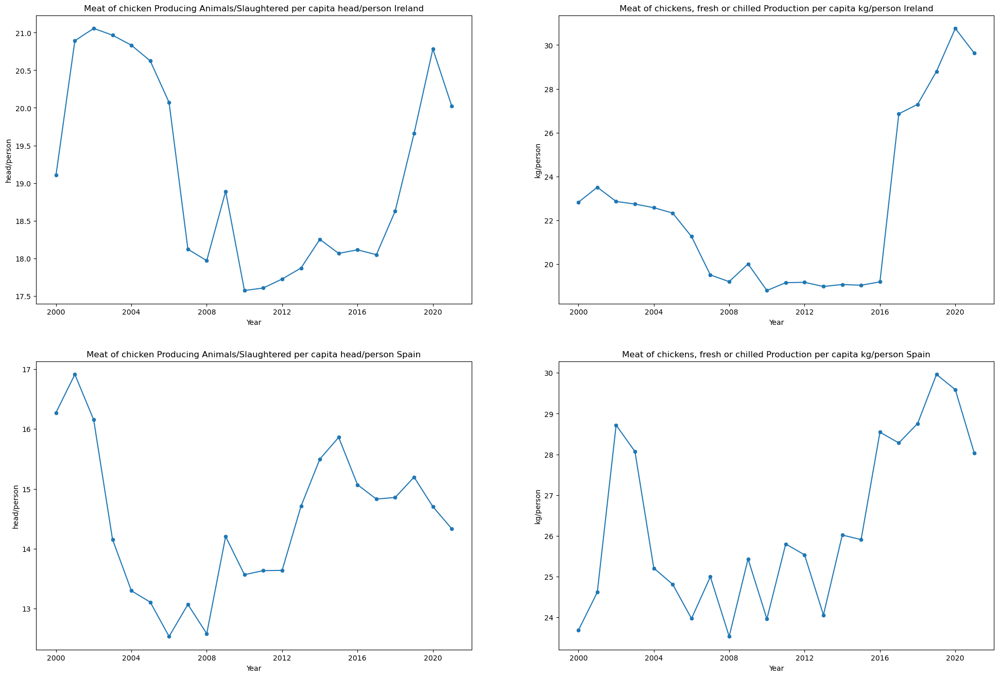

In [137]:
fig, axes = plt.subplots(ncols=2,nrows=2, figsize=(24,16))

for column, ax in zip(df_21cent.columns.to_list(), axes.ravel()):
    sns.lineplot(data=df_21cent, x=df_21cent.index, y=column, ax=ax)
    sns.scatterplot(data=df_21cent, x=df_21cent.index, y=column, ax=ax)
    if '_x' in column:
        ax.set_title(column.replace('_x', ' Ireland'))
    if '_y' in column:
        ax.set_title(column.replace('_y', ' Spain'))
    if 'head' in column:
        ax.set_ylabel('head/person')
    if 'kg' in column:
        ax.set_ylabel('kg/person')
    
#plt.savefig('graphs/chicken_production_per_capita_2000-2021.png', dpi=300, bbox_inches = "tight")
plt.show()

In [138]:
df_21cent.describe()

,Meat of chicken Producing Animals/Slaughtered per capita head/person_x,"Meat of chickens, fresh or chilled Production per capita kg/person_x",Meat of chicken Producing Animals/Slaughtered per capita head/person_y,"Meat of chickens, fresh or chilled Production per capita kg/person_y"
count,22.000000,22.000000,22.000000,22.000000
mean,19.130070,22.428086,14.463520,26.251033
std,1.293842,3.862592,1.218886,2.085218
min,17.570672,18.786253,12.535469,23.533206
25%,18.051029,19.165730,13.584417,24.667113
50%,18.759068,21.787979,14.518818,25.669097
75%,20.486675,23.342081,15.165237,28.228761
max,21.056643,30.759470,16.912376,29.963482


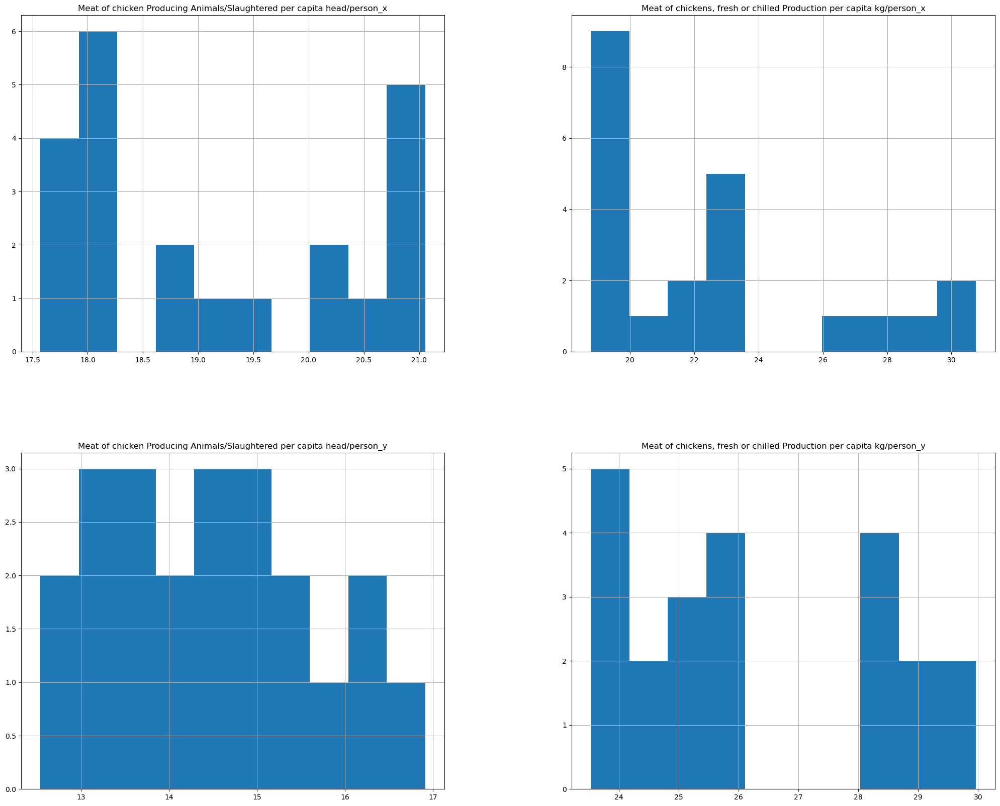

In [139]:
%matplotlib inline
df_21cent.hist(figsize=(25,20)); #uhhh not exactly sure that's a normal distribution
#I know there's only 22 samples so it's hard to tell

#### Two sample T-Test
Assumptions required:
- The means of two populations should follow normal distribution. Under weak assumptions, this follows in large samples from the central limit theorem, even when the distribution of observations in each group is non-normal.
- The two populations should have same variance (testable with F-test, and others). If the sample sizes are equal, the t-test is highly robust to the presence of unequal variances. Welch's t-test (variant of student's t-test) is insensitive to equality of the variances regardless of whether the sample sizes are similar.
- The samples must be independent.

Most two sample t-tests are robust to all but large deviations from the assumptions.

In [140]:
import scipy.stats as stats
from scipy.stats import levene

In [141]:
#not strictly necessary but easier to keep track of
#and shorter names
heads_irl = df_21cent['Meat of chicken Producing Animals/Slaughtered per capita head/person_x']
heads_spa = df_21cent['Meat of chicken Producing Animals/Slaughtered per capita head/person_y']
kg_irl = df_21cent['Meat of chickens, fresh or chilled Production per capita kg/person_x']
kg_spa = df_21cent['Meat of chickens, fresh or chilled Production per capita kg/person_y']

In [142]:
#H0: var(heads_irl) = var(heads_spain)
#H1: varience not equal

#levene is like f-test but more robust

"""
Perform Levene test for equal variances.

The Levene test tests the null hypothesis that all input samples are from populations with equal variances. 
Levene’s test is an alternative to Bartlett’s test bartlett in the case where there are significant deviations from normality.
"""
stat, p = levene(heads_irl, heads_spa, center = 'mean')
if p < 0.05: #alpha = 0.05
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Reject H0. Variances are not equal')
else:
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Accept H0. Variances are equal')

Statistic:  0.8027447998669625
p-value:  0.3753806221830873
Accept H0. Variances are equal


In [143]:
# two sample student t-test to see if means are equal now that we know variences are
# H0: mu1=mu2
# H1: m1!=m2

stat, p = stats.ttest_ind(heads_irl, heads_spa, equal_var=True)

if p < 0.05: #alpha = 0.05
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Reject H0. Means are not equal')
else:
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Accept H0. Means are equal')

Statistic:  12.313562143198162
p-value:  1.585743043979621e-15
Reject H0. Means are not equal


The average number of animals killed per year per capita in Spain and Ireland over the last twenty years is not equal. The average number of chickens killed per person in Ireland is greater than in Spain.

In [144]:
print(heads_irl.mean(), ' > ', heads_spa.mean())

19.13006963600341  >  14.463519864201375


Now for kg of meat produced per person per year:

In [145]:
# first, test variance

stat, p = levene(kg_irl, kg_spa, center = 'mean')
if p < 0.05: #alpha = 0.05
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Reject H0. Variances are not equal')
else:
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Accept H0. Variances are equal')

Statistic:  5.5233554790493935
p-value:  0.023537390171485706
Reject H0. Variances are not equal


In [146]:
# two sample student t-test to see if means are equal
# variances are no equal so change to false
# H0: mu1=mu2
# H1: m1!=m2

stat, p = stats.ttest_ind(kg_irl, kg_spa, equal_var=False)

if p < 0.05: #alpha = 0.05
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Reject H0. Means are not equal')
else:
    print('Statistic: ', stat)
    print('p-value: ', p)
    print('Accept H0. Means are equal')

Statistic:  -4.085018318589101
p-value:  0.00027229579127078233
Reject H0. Means are not equal


The average kilograms of chicken meat produced per year per capita in Spain and Ireland over the last twenty years is not equal. The average kg of meat per person in Ireland is less than in Spain.

In [147]:
print(kg_irl.mean(), ' < ',  kg_spa.mean())

22.42808628729534  <  26.25103256910961


### Trade 
Let's think about trade crops and livestock products

In [148]:
df_TCL

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description
0,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1961,1961-01-01,tonnes,4544.0,A,Official figure
1,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1962,1962-01-01,tonnes,3182.0,A,Official figure
2,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1963,1963-01-01,tonnes,4845.0,A,Official figure
3,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1964,1964-01-01,tonnes,433.0,A,Official figure
4,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1965,1965-01-01,tonnes,80132.0,A,Official figure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8715,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2017,2017-01-01,1000 US$,76166.0,A,Official figure
8716,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2018,2018-01-01,1000 US$,96977.0,A,Official figure
8717,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2019,2019-01-01,1000 US$,145026.0,A,Official figure
8718,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2020,2020-01-01,1000 US$,180098.0,A,Official figure


In [149]:
df_TCL['Item Element']  = df_TCL['Item'] + ' ' + df_TCL['Element'] + ' ' + df_TCL['Unit']

In [150]:
df_TCL.head()

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Item Element
0,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1961,1961-01-01,tonnes,4544.0,A,Official figure,Barley Import Quantity tonnes
1,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1962,1962-01-01,tonnes,3182.0,A,Official figure,Barley Import Quantity tonnes
2,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1963,1963-01-01,tonnes,4845.0,A,Official figure,Barley Import Quantity tonnes
3,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1964,1964-01-01,tonnes,433.0,A,Official figure,Barley Import Quantity tonnes
4,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1965,1965-01-01,tonnes,80132.0,A,Official figure,Barley Import Quantity tonnes


In [151]:
vc_irl = df_TCL[df_TCL['Area']=='Ireland']['Item Element'].value_counts()
vc_irl #value counts of product element based on ireland

Barley Import Quantity tonnes                               61
Maize (corn) Export Quantity tonnes                         61
Millet Import Value 1000 US$                                61
Millet Import Quantity tonnes                               61
Meat of chickens, fresh or chilled Export Value 1000 US$    61
                                                            ..
Barley flour and grits Export Quantity tonnes                6
Cereals n.e.c. Export Quantity tonnes                        6
Cereals n.e.c. Export Value 1000 US$                         6
Mixed grain Import Quantity tonnes                           3
Mixed grain Import Value 1000 US$                            3
Name: Item Element, Length: 86, dtype: int64

In [152]:
vc_irl[vc_irl<20] # lowest value count elements

Poultry fat, rendered Export Value 1000 US$      8
Bran of cereals n.e.c. Import Quantity tonnes    8
Barley flour and grits Import Quantity tonnes    8
Barley flour and grits Import Value 1000 US$     8
Cereals n.e.c. Import Value 1000 US$             8
Cereals n.e.c. Import Quantity tonnes            8
Millet Export Quantity tonnes                    8
Poultry fat, rendered Export Quantity tonnes     8
Millet Export Value 1000 US$                     8
Bran of cereals n.e.c. Import Value 1000 US$     8
Poultry fat, rendered Import Value 1000 US$      8
Poultry fat, rendered Import Quantity tonnes     8
Bran of cereals n.e.c. Export Quantity tonnes    7
Bran of cereals n.e.c. Export Value 1000 US$     7
Barley flour and grits Export Value 1000 US$     6
Barley flour and grits Export Quantity tonnes    6
Cereals n.e.c. Export Quantity tonnes            6
Cereals n.e.c. Export Value 1000 US$             6
Mixed grain Import Quantity tonnes               3
Mixed grain Import Value 1000 U

In [153]:
keep = list(vc_irl[vc_irl>20].index) #keep values with greater than 20 occurences

In [154]:
keep

['Barley Import Quantity tonnes',
 'Maize (corn) Export Quantity tonnes',
 'Millet Import Value 1000 US$',
 'Millet Import Quantity tonnes',
 'Meat of chickens, fresh or chilled Export Value 1000 US$',
 'Meat of chickens, fresh or chilled Export Quantity tonnes',
 'Meat of chickens, fresh or chilled Import Value 1000 US$',
 'Meat of chickens, fresh or chilled Import Quantity tonnes',
 'Maize (corn) Export Value 1000 US$',
 'Maize (corn) Import Value 1000 US$',
 'Chickens Export Quantity 1000 Head',
 'Maize (corn) Import Quantity tonnes',
 'Green corn (maize) Import Value 1000 US$',
 'Green corn (maize) Import Quantity tonnes',
 'Barley Import Value 1000 US$',
 'Edible offals and liver of chickens and guinea fowl, fresh, chilled or frozen Export Quantity tonnes',
 'Edible offals and liver of chickens and guinea fowl, fresh, chilled or frozen Import Value 1000 US$',
 'Edible offals and liver of chickens and guinea fowl, fresh, chilled or frozen Import Quantity tonnes',
 'Poultry meat pre

In [155]:
df_TCL_trim = df_TCL[df_TCL['Item Element'].isin(keep)] # apply to whole dataset

In [156]:
df_TCL_trim

,Domain Code,Domain,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year Code,Year,Unit,Value,Flag,Flag Description,Item Element
0,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1961,1961-01-01,tonnes,4544.0,A,Official figure,Barley Import Quantity tonnes
1,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1962,1962-01-01,tonnes,3182.0,A,Official figure,Barley Import Quantity tonnes
2,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1963,1963-01-01,tonnes,4845.0,A,Official figure,Barley Import Quantity tonnes
3,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1964,1964-01-01,tonnes,433.0,A,Official figure,Barley Import Quantity tonnes
4,TCL,Crops and livestock products,372,Ireland,5610,Import Quantity,0115,Barley,1965,1965-01-01,tonnes,80132.0,A,Official figure,Barley Import Quantity tonnes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8715,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2017,2017-01-01,1000 US$,76166.0,A,Official figure,Wheat Export Value 1000 US$
8716,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2018,2018-01-01,1000 US$,96977.0,A,Official figure,Wheat Export Value 1000 US$
8717,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2019,2019-01-01,1000 US$,145026.0,A,Official figure,Wheat Export Value 1000 US$
8718,TCL,Crops and livestock products,724,Spain,5922,Export Value,0111,Wheat,2020,2020-01-01,1000 US$,180098.0,A,Official figure,Wheat Export Value 1000 US$


In [157]:
df_TCL_irl = df_TCL[df_TCL['Area']=='Ireland']
df_TCL_spa = df_TCL[df_TCL['Area']=='Spain']

In [158]:
df_TCL_irl_pivot = df_TCL_irl.pivot(index='Year', columns='Item Element', values='Value')
df_TCL_spa_pivot = df_TCL_spa.pivot(index='Year', columns='Item Element', values='Value')

In [159]:
df_TCL_irl_pivot

Item Element,Barley Export Quantity tonnes,Barley Export Value 1000 US$,Barley Import Quantity tonnes,Barley Import Value 1000 US$,Barley flour and grits Export Quantity tonnes,Barley flour and grits Export Value 1000 US$,Barley flour and grits Import Quantity tonnes,Barley flour and grits Import Value 1000 US$,"Barley, pearled Export Quantity tonnes","Barley, pearled Export Value 1000 US$",...,Soya beans Import Quantity tonnes,Soya beans Import Value 1000 US$,Sunflower seed Export Quantity tonnes,Sunflower seed Export Value 1000 US$,Sunflower seed Import Quantity tonnes,Sunflower seed Import Value 1000 US$,Wheat Export Quantity tonnes,Wheat Export Value 1000 US$,Wheat Import Quantity tonnes,Wheat Import Value 1000 US$
Year,,,,,,,,,,,,,,,,,,,,,
1961-01-01,1755.00,116.0,4544.00,356.0,NaN,NaN,NaN,NaN,0.00,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,146626.00,7334.0,262579.00,18764.0
1962-01-01,6135.00,382.0,3182.00,270.0,NaN,NaN,NaN,NaN,0.00,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,32076.00,1687.0,136920.00,10194.0
1963-01-01,71957.00,4191.0,4845.00,403.0,NaN,NaN,NaN,NaN,0.00,0.0,...,19.00,1.0,0.00,0.0,0.00,0.0,57051.00,2828.0,232558.00,17097.0
1964-01-01,80.00,5.0,433.00,36.0,NaN,NaN,NaN,NaN,0.00,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,150.00,9.0,171079.00,12460.0
1965-01-01,93.00,6.0,80132.00,5525.0,NaN,NaN,NaN,NaN,0.00,0.0,...,1160.00,110.0,0.00,0.0,0.00,0.0,0.00,0.0,329927.00,22752.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,28523.68,5696.0,181513.00,33506.0,6.77,3.0,4405.09,904.0,NaN,NaN,...,45518.72,14038.0,22.49,84.0,3088.87,1944.0,13684.27,3265.0,314040.35,60107.0
2018-01-01,14832.90,3483.0,400216.30,95437.0,4.30,3.0,2285.98,541.0,NaN,NaN,...,29902.26,10617.0,22.83,93.0,4317.18,2438.0,20135.31,4828.0,455658.16,101796.0
2019-01-01,52846.22,7334.0,138359.77,32217.0,NaN,NaN,404.23,180.0,0.73,0.0,...,27003.35,9807.0,26.02,94.0,3938.09,3057.0,26241.10,6056.0,292921.90,62281.0


In [160]:
df_TCL_spa_pivot

Item Element,Barley Export Quantity tonnes,Barley Export Value 1000 US$,Barley Import Quantity tonnes,Barley Import Value 1000 US$,Barley flour and grits Export Quantity tonnes,Barley flour and grits Export Value 1000 US$,Barley flour and grits Import Quantity tonnes,Barley flour and grits Import Value 1000 US$,"Barley, pearled Export Quantity tonnes","Barley, pearled Export Value 1000 US$",...,Soya beans Import Quantity tonnes,Soya beans Import Value 1000 US$,Sunflower seed Export Quantity tonnes,Sunflower seed Export Value 1000 US$,Sunflower seed Import Quantity tonnes,Sunflower seed Import Value 1000 US$,Wheat Export Quantity tonnes,Wheat Export Value 1000 US$,Wheat Import Quantity tonnes,Wheat Import Value 1000 US$
Year,,,,,,,,,,,,,,,,,,,,,
1961-01-01,10.00,0.0,361700.00,21030.0,NaN,NaN,NaN,NaN,0.00,0.0,...,15000.00,1600.0,40.00,5.0,9349.00,1709.0,13000.00,960.0,962700.00,70620.0
1962-01-01,20.00,1.0,107500.00,7010.0,NaN,NaN,NaN,NaN,0.00,0.0,...,16580.00,1853.0,5.00,1.0,16487.00,3718.0,3000.00,400.0,933400.00,66630.0
1963-01-01,20.00,1.0,362800.00,22600.0,NaN,NaN,NaN,NaN,0.00,0.0,...,15610.00,1751.0,201.00,30.0,417.00,78.0,0.00,0.0,196900.00,13410.0
1964-01-01,15.00,1.0,774000.00,48830.0,NaN,NaN,NaN,NaN,0.00,0.0,...,56320.00,6434.0,55.00,9.0,208.00,29.0,0.00,0.0,78500.00,5460.0
1965-01-01,25.00,2.0,539500.00,35920.0,NaN,NaN,NaN,NaN,0.00,0.0,...,339880.00,39568.0,40.00,9.0,951.00,138.0,0.00,0.0,144800.00,9460.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,84329.28,20853.0,1341121.92,235848.0,4560.51,1340.0,11569.33,2471.0,171.57,79.0,...,3396008.86,1367087.0,15688.76,88481.0,461875.29,235904.0,262044.64,76166.0,6185287.16,1204416.0
2018-01-01,255083.71,65986.0,465965.00,101891.0,3973.33,1452.0,3821.24,1221.0,261.43,135.0,...,3397812.44,1344883.0,18393.17,108412.0,412949.51,244682.0,331295.03,96977.0,6028087.66,1340117.0
2019-01-01,151462.10,39831.0,1221054.54,230123.0,285.88,167.0,4040.28,1024.0,346.17,154.0,...,3323467.11,1219996.0,19887.44,75877.0,534874.46,277360.0,513221.81,145026.0,5292711.11,1077847.0


In [161]:
df_irl_merged = pd.merge(df_irl_merged, df_TCL_irl_pivot, on='Year')
df_spa_merged = pd.merge(df_spa_merged, df_TCL_spa_pivot, on='Year')

In [162]:
df_irl_merged #yeah it's a bit horrendous and losing its nuance but it's more useful for machine learning

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head",...,Soya beans Import Quantity tonnes,Soya beans Import Value 1000 US$,Sunflower seed Export Quantity tonnes,Sunflower seed Export Value 1000 US$,Sunflower seed Import Quantity tonnes,Sunflower seed Import Value 1000 US$,Wheat Export Quantity tonnes,Wheat Export Value 1000 US$,Wheat Import Quantity tonnes,Wheat Import Value 1000 US$
Year,,,,,,,,,,,,,,,,,,,,,
1961-01-01,1539.928,2807.005,1396.739,1410.265,1280.110,146373.0,515400.0,35211.0,7258.0,8750.0,...,0.00,0.0,0.00,0.0,0.00,0.0,146626.00,7334.0,262579.00,18764.0
1962-01-01,1536.686,2813.067,1400.138,1412.929,1288.262,164219.0,603200.0,36731.0,6954.0,8400.0,...,0.00,0.0,0.00,0.0,0.00,0.0,32076.00,1687.0,136920.00,10194.0
1963-01-01,1536.216,2824.089,1405.725,1418.364,1298.803,173608.0,588900.0,33921.0,7050.0,9550.0,...,19.00,1.0,0.00,0.0,0.00,0.0,57051.00,2828.0,232558.00,17097.0
1964-01-01,1536.905,2837.436,1412.455,1424.982,1310.435,183644.0,550699.0,29987.0,6902.0,10500.0,...,0.00,0.0,0.00,0.0,0.00,0.0,150.00,9.0,171079.00,12460.0
1965-01-01,1537.713,2852.401,1420.136,1432.265,1322.242,187790.0,615730.0,32788.0,8276.0,11300.0,...,1160.00,110.0,0.00,0.0,0.00,0.0,0.00,0.0,329927.00,22752.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,1764.335,4771.854,2409.471,2362.383,2997.322,180186.0,1505811.0,83570.0,15504.0,86116.0,...,45518.72,14038.0,22.49,84.0,3088.87,1944.0,13684.27,3265.0,314040.35,60107.0
2018-01-01,1769.220,4834.507,2440.194,2394.313,3034.528,185210.0,1181560.0,63796.0,NaN,90059.0,...,29902.26,10617.0,22.83,93.0,4317.18,2438.0,20135.31,4828.0,455658.16,101796.0
2019-01-01,1773.798,4896.019,2470.880,2425.139,3073.341,179360.0,1479600.0,82493.0,NaN,96247.0,...,27003.35,9807.0,26.02,94.0,3938.09,3057.0,26241.10,6056.0,292921.90,62281.0


In [163]:
df_spa_merged

,Rural population,Total Population - Both sexes,Total Population - Female,Total Population - Male,Urban population,Barley Area harvested ha,Barley Production tonnes,Barley Yield hg/ha,Chickens Stocks 1000 Head,"Meat of chickens, fresh or chilled Producing Animals/Slaughtered 1000 Head",...,Soya beans Import Quantity tonnes,Soya beans Import Value 1000 US$,Sunflower seed Export Quantity tonnes,Sunflower seed Export Value 1000 US$,Sunflower seed Import Quantity tonnes,Sunflower seed Import Value 1000 US$,Wheat Export Quantity tonnes,Wheat Export Value 1000 US$,Wheat Import Quantity tonnes,Wheat Import Value 1000 US$
Year,,,,,,,,,,,,,,,,,,,,,
1961-01-01,13158.081,30711.863,15788.245,14923.619,17659.489,1450000.0,1743700.0,12026.0,34210.0,79800.0,...,15000.00,1600.0,40.00,5.0,9349.00,1709.0,13000.00,960.0,962700.00,70620.0
1962-01-01,12993.319,31052.630,15955.797,15096.834,18171.756,1449395.0,2161952.0,14916.0,36248.0,112100.0,...,16580.00,1853.0,5.00,1.0,16487.00,3718.0,3000.00,400.0,933400.00,66630.0
1963-01-01,12828.537,31388.554,16120.695,15267.858,18695.848,1447100.0,2070700.0,14309.0,41822.0,159000.0,...,15610.00,1751.0,201.00,30.0,417.00,78.0,0.00,0.0,196900.00,13410.0
1964-01-01,12659.259,31747.643,16297.975,15449.668,19226.145,1381000.0,1926900.0,13953.0,40973.0,182350.0,...,56320.00,6434.0,55.00,9.0,208.00,29.0,0.00,0.0,78500.00,5460.0
1965-01-01,12484.310,32112.015,16477.720,15634.294,19756.731,1374410.0,1891447.0,13762.0,37368.0,204750.0,...,339880.00,39568.0,40.00,9.0,951.00,138.0,0.00,0.0,144800.00,9460.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-01-01,9233.918,46584.170,23729.720,22854.449,37120.403,2597527.0,5785944.0,22275.0,137500.0,690837.0,...,3396008.86,1367087.0,15688.76,88481.0,461875.29,235904.0,262044.64,76166.0,6185287.16,1204416.0
2018-01-01,9130.380,46792.043,23848.825,22943.218,37267.072,2569460.0,9554160.0,37184.0,NaN,695196.0,...,3397812.44,1344883.0,18393.17,108412.0,412949.51,244682.0,331295.03,96977.0,6028087.66,1340117.0
2019-01-01,9025.938,47131.372,24028.434,23102.938,37415.111,2693510.0,7744150.0,28751.0,NaN,716259.0,...,3323467.11,1219996.0,19887.44,75877.0,534874.46,277360.0,513221.81,145026.0,5292711.11,1077847.0


Something about years Irish chicken production meets meat demand, how much do we import? Compare with Spain

Looking at the agricultural strucural data from census. Maybe there's stats worth comparing here?

In [ ]:
df_farm = df_dict['FAOSTAT_data_en_structural_data_from_agri_census']

In [ ]:
df_farm

In [ ]:
df_farm['Element'].unique()

In [ ]:
df_farm['Item'].unique()

In [ ]:
df_farm[df_farm['Element'] == 'Area']

In [ ]:
df_farm['Item Code'].unique()

What do these item codes mean?
Taken from https://www.fao.org/faostat/en/#definitions

| Item Code | Item | Description |
| --- | --- | :-- |
| 27002 | Holdings | An agricultural holding (or farm) is an economic unit of agricultural production under single management comprising all land used and livestock kept wholly or partly for agricultural production purposes, without regard to title, legal form or size. Holdings are the unit of interest of the census. |
| 270030 | 	Holdings with land size 0-<1 | This item refers to holdings with agricultural land less than 1 hectare. |
| 270031 | 	Holdings with land size 1-<2 | This item refers to holdings with agricultural land size 1 to 2 hectares. |
| 270032 | 	Holdings with land size 2-<3 | This item refers to holdings with agricultural land size 2 to 3 hectares (only in the WCA 2010) |
| 270033 | Holdings with land size 2-<5 | This item refers to holdings with agricultural land size 2 to 5 hectares (only in the WCA 2010) |
| 270034 | Holdings with land size 3-<4 | This item refers to holdings with agricultural land size 3 to 4 hectares (only in the WCA 2010) |
| 270035 | Holdings with land size 4-<5 | This item refers to holdings with agricultural land size 4 to 5 hectares (only in the WCA 2010) |
| 270036 | Holdings with land size 5-<10 | This item refers to holdings with agricultural land size 5 to 10 hectares |
| 270037 | Holdings with land size 10-<20 | This item refers to holdings with agricultural land size 10 to 20 hectares |
| 270038 | Holdings with land size 20-<50 | This item refers to holdings with agricultural land size 20 to 50 hectares |
| 270039 | Holdings with land size 50-<100 | This item refers to holdings with agricultural land size 50 to 100 hectares |
| 2700300 | Holdings with land size 100-<200 | This item refers to holdings with agricultural land size 100 to 200 hectares |
| 2700301 | Holdings with land size 200-<500 | This item refers to holdings with agricultural land size 200 to 500 hectares |
| 2700302 | Holdings with land size 500-<1000 | This item refers to holdings with agricultural land size 500 to 1 000 hectares |
| 2700304 | Holdings with land size >=1000 | This item refers to holdings with agricultural land greater than or equal to 1 000 hectares (only in the WCA 1990 and WCA 2000) |
| 27004 | Parcels | This item refers to any piece of land of one land tenure type entirely surrounded by other land, water, road, forest, another parcels or other features. A parcel may consist of one or more fields or plots adjacent to each other. |
| 270050 | Holdings operated by civil persons, total | This item refers to the total number of holdings managed by civil person (male and female) in the household sector. This item is collected only from holdings in the household sector. |
| 270051 | Holdings operated by civil persons, female | This item refers to the number of holdings operated by civil persons and managed by female holders in the household sector. This item is collected only from holdings in the household sector |
| 270052 | Holdings operated by civil persons, male | This item refers to the number of holdings operated by civil persons and managed by male holders in the household sector. This item is collected only from holdings in the household sector |
| 270060 | 	Holdings owned by the holder or in owner-like possession | This item refers to the legal ownership of the land which implies that the owner of land has the right to determine how the land is used (within certain constraints), and may have the right to sell or rent out the land. It also implies that the owner may access credit using the land as collateral. |
| 270061 | Holdings rented from others | This item refers to land that is rented or leased by the holding from other persons, usually for a limited time period. Rental arrangements can take different forms. Land may be rented for an agreed sum of money and/or produce, for a share of the produce or in exchange for services. Land may also be granted rent-free. |
| 270062 | 	Holdings operated under other forms of tenure | This item refers to other types of land tenure which may include land operated on a squatter basis – that is, private or public land operated without ownership title and without the owner’s consent. Other land tenure types include: land operated under transitory tenure forms, such as trusteeship; land received by members of collective holdings for individual use; and land under inheritance proceedings. |
| 270064 | Holdings under more than one form of tenure | This item refers to holdings that have used an owned land, rented land and/or land under other types of tenure within the census reference period. |
| 270070 | Civil persons | This item refers to agricultural holders that have a legal status as individual or group of individuals and make the major decisions regarding resource use and exercises management control over the agricultural holding operation. |
| 270071 | Juridical | This item refers to holdings in the non-household sector operated by a juridical person who is neither an individual nor a group of individuals, such as a corporation, a cooperative, a governmental institution, etc. They are defined within the context of national laws and customs. Other holdings in the non-household sector include tribes, clans, private schools and religious institutions. |
| 270090 | Household members, engaged in agriculture, total | This item refers to the total household members in the household sector, males and females, who worked on the holding in paid or unpaid work. |
| 270091 | Household members, engaged in agriculture, female | This item refers to the number of female household members in the household sector who worked on the holding in paid or unpaid work |
| 270092 | Household members, engaged in agriculture, male | This item refers to the number of male household members in the household sector who worked on the holding in paid or unpaid work |
| 27010 | Hired permanent workers | This item refers to hired paid permanent workers on the holding |


df_farm inspired me to download the eurostat data for poultry holdings

Reposting the code explanations here:

| column code | column label | value code | value label |
| --- | :-- | --- | :-- |
| **freq** | **Time Frequency** | A | Annual |
| **n_heads** | **Number of heads** | 0 | No Heads |
| | | TOTAL | Total |
| | | 1-99 | From 1 to 99 heads |
| | | 100-999| From 100 to 999 heads |
| | | 1000-2999 | From 1 000 to 2 999 heads |
| | | 3000-4999 | From 3 000 to 4 999 heads |
| | | 5000-9999 | From 5 000 to 9 999 heads |
| | | 10000-49999 | From 10 000 to 49 999 heads |
| | | 50000-99999 | From 50 000 to 99 999 heads |
| | | GE100000 | 100 000 heads or more |
| **agrarea** | **Agricultural area** | TOTAL | Total |
| **indic_ef** | **Eurofarm indicators** | HOLD_HOLD | hold: Total number of holdings |
| | | C_LIVESTOCK_HOLD| hold: Number of holdings with livestock |
| | | C_5_1000_HEADS | 1000 heads: Poultry |
| | | C_5_HOLD | hold: Poultry|
| | | C_5_1_1000_HEADS | 1000 heads: Poultry - broilers |
| | | C_5_1_HOLD | hold: Poultry - broilers|
| | | C_5_2_1000_HEADS | 1000 heads: Laying hens |
| | | C_5_2_HOLD | hold: Laying hens |
| **geo** | **Geopolitical entity (reporting)** | IE | Ireland |
| | | ES | Spain |

In [ ]:
df_chicken_farm = df_dict['eurostat_poultry_holdings_4364731_linear']

In [ ]:
df_chicken_farm

In [ ]:
df_chicken_farm[df_chicken_farm['geo'] == 'IE'] # I dont understand row 1 ( and the first 10 in the datset)
# how can n_head = 0 and C_5_2_1000_HEADS = 2520? Farms with zero chickens shouldn't have 2520000 laying hens?


In [ ]:
df_chicken_farm[(df_chicken_farm['geo'] == 'IE') & (df_chicken_farm['indic_ef'] == 'C_5_1_1000_HEADS')]

In [ ]:
import numpy as np  

# this is baddddd practice and bad programming
# i was just against a mental wall and needed to see my data somehow

heads = np.array([0,0,0,0,0,2520000,3130000,1450000]) 
hold = np.array([310, 10, 0, 0, 0, 90, 40, 10])
bins_max = np.array([99, 999, 2999, 4999, 9999, 49999, 99999, 199999])
bins = np.array([50, 450, 2000, 3000, 7500, 30000, 75000, 150000]) # midpoint0

In [ ]:
# bad graphs. I just needed some visualisation

plt.scatter(bins, hold)
plt.plot(bins, hold)
#plt.scatter(bins, heads)
plt.scatter(bins, heads/bins)
plt.plot(bins, heads/bins)
plt.show()

In [ ]:
plt.scatter(bins, bins)
plt.scatter(bins,heads/(hold+1))
plt.plot(bins, bins)
plt.plot(bins,heads/(hold+1))
plt.show()

In [ ]:
# turn those ranges from strings to values 
df_chicken_farm.loc[df_chicken_farm['n_head'] == '0', 'head_min'] = 0
df_chicken_farm.loc[df_chicken_farm['n_head'] == '0', 'head_max'] = 0
df_chicken_farm.loc[df_chicken_farm['n_head'] == 'GE100000', 'head_min'] = 100000
df_chicken_farm.loc[df_chicken_farm['n_head'] == 'GE100000', 'head_max'] = 200000 #just chosen for an upper limit
df_chicken_farm.loc[df_chicken_farm['n_head'] == 'TOTAL', 'head_min'] = 0
df_chicken_farm.loc[df_chicken_farm['n_head'] == 'TOTAL', 'head_max'] = 200000

In [ ]:
df_chicken_farm['n_head'].unique()

In [ ]:
for n_head in df_chicken_farm['n_head'].unique():
    if '-' in n_head:
        min_max = n_head.split('-')
        df_chicken_farm.loc[df_chicken_farm['n_head'] == n_head, 'head_min'] = int(min_max[0])
        df_chicken_farm.loc[df_chicken_farm['n_head'] == n_head, 'head_max'] = int(min_max[1])

In [ ]:
df_chicken_farm

In [ ]:
df_chicken_farm[120:]

How to make an interactive dashboard in jupyter notebook

To create an interactive dashboard in a Jupyter notebook, you can use a combination of Python libraries and tools such as:

1.    pandas: This library can be used to manipulate and visualize data stored in tabular formats, such as CSV or Excel files.

2.    matplotlib: This library provides a wide range of plotting functions that can be used to create various types of charts and plots.

3.    seaborn: This library is built on top of matplotlib and provides additional functions and features for creating visually appealing plots.

4.    plotly: This library provides interactive plotting functions that can be used to create interactive charts and graphs.

To create an interactive dashboard, you can follow these steps:

1.    Load the data into a pandas DataFrame using the pandas "read_csv" or "read_excel" functions.

2.    Use pandas functions to manipulate and clean the data as needed.

3.    Use matplotlib, seaborn, or plotly to create plots and charts based on the data.

4.    Use the "interact" function from the "ipywidgets" library to create interactive controls that allow the user to select different options or filters for the dashboard.

5.    Use the "display" function from the "IPython.display" library to display the plots and interactive controls in the Jupyter notebook.

By following these steps, you can create an interactive dashboard in a Jupyter notebook that allows the user to explore and visualize the data in a variety of ways.


# Machine Learning

### What do chickens eat?

Chickens are omnivorous animals, which means that they eat a variety of plant and animal-based foods. The specific diet of a chicken will depend on its age, size, and purpose (such as laying eggs or being raised for meat). Here are some common foods that chickens might eat:

1.    Grains: Chickens will often eat a variety of grains, including corn, wheat, oats, and barley. These grains can be fed to chickens in whole form or ground into a meal.

2.    Seeds and nuts: Chickens will also eat a variety of seeds and nuts, such as sunflower seeds, pumpkin seeds, and almonds.

3.    Vegetables and fruits: Chickens will eat many types of vegetables and fruits, such as leafy greens, peas, beans, carrots, apples, and berries.

4.    Insects: Chickens will also supplement their diet with insects, such as beetles, worms, and grasshoppers.

5.    Commercial feed: In addition to these natural foods, chickens may also be fed a commercial feed mix, which is a formulated blend of grains, proteins, vitamins, and minerals.

It is important to provide chickens with a balanced diet that meets their nutritional needs, as this can affect their health, egg production, and overall well-being.

### Do grain import prices affect the consumer prices of chicken

Grain import prices can potentially affect the consumer prices of chicken, as grain is a major component of the diet of chickens raised for meat or egg production. If grain prices increase, this can lead to higher feed costs for chicken producers, which could in turn lead to higher consumer prices for chicken. However, it is worth noting that there are many other factors that can also influence the consumer prices of chicken, such as the cost of labor, transportation, and other inputs, as well as market demand and supply. As a result, the relationship between grain import prices and consumer prices of chicken is likely to be complex and may vary over time.

Okay, realising we don't have consumer price data for poultry. We just have the consumer price index, but that is for all food, not chicken specifally. However, we do have producer prices. So, let's see what factors affect producer prices of chicken meat.

In [ ]:
df_prod_price = df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices'][df_dict['FAOSTAT_data_en__IRL_SPA_producer_prices']['Area']=='Ireland']

In [ ]:
df_prod_price

As much as it burns me, we're going to stick with USD, as the trade prices are also in USD so the units are consistent.

In [ ]:
print(df_prod_price['Item'].unique(), df_prod_price['Element'].unique())

In [ ]:
df_prod_price = df_prod_price[df_prod_price['Element']=='Producer Price (USD/tonne)']

In [ ]:
print(df_prod_price['Item'].unique(), df_prod_price['Element'].unique()) #where did maize go? whatever, we barely grow it

In [ ]:
df_prod_price

In [ ]:
df_prod_price['Item Element'] = df_prod_price['Item'] + ' ' + df_prod_price['Element']

In [ ]:
df_prod_price.head()

In [ ]:
df_prod_price_pivot = df_prod_price.pivot(index='Year', columns='Item Element', values='Value')

In [ ]:
df_prod_price_pivot

In [ ]:
#I don't understand the difference between 'biological' and not but this column is nearly empty so. Drop.
df_prod_price_pivot.drop('Meat of chickens, fresh or chilled Producer Price (USD/tonne)', axis=1, inplace=True)

In [ ]:
df_prod_price_pivot # Oh. This chicken data only goes from 1991 to 2012?? I can't build a model with that as my target variable

Wahh. I was going to do price but not enough data. What should be my target variable now?

In [ ]:
df_irl_merged

In [ ]:
print(df_irl_merged.columns.tolist())

In [ ]:
#what are all my chicken columns
for column in df_irl_merged.columns.tolist():
    if 'chicken' in column.lower():
        print(column)

Target aquired: 'Meat of chickens, fresh or chilled Export Value 1000 US$'. Or USD/tonnes for an actual price unit.

Let's inspect column names of df_irl_merged again so I can choose which columns to keep as features for the ML dataset.

In [ ]:
grains_item # from much earlier dataset - df_QCL['Item']

In [ ]:
for column in df_irl_merged.columns.tolist():
    for grain in grains_item:
        if grain.lower() in column.lower():
            print(column)

In [ ]:
for column in df_irl_merged.columns.tolist(): #it's just easier to read this way
    print(column)

### What is cake of soya bean

Soybean cake, also known as soybean meal or soymeal, is a byproduct of soybean oil production. It is made by grinding up the residue of soybeans after the oil has been extracted, and it is a rich source of protein, fiber, and other nutrients.

Soybean cake is commonly used as a feed ingredient for livestock, particularly for poultry and pigs. It is a popular choice due to its high protein content, which can help to support muscle growth and development. Soybean cake can also be used as a protein source in aquaculture and as a fertilizer in agriculture.

In addition to its use as a feed and fertilizer, soybean cake can also be used as a source of protein in human food products, such as protein bars and protein powders. It is also sometimes used as an ingredient in other products, such as plastics and adhesives.

Soybean cake is typically sold in a dry, pelleted form, and it can be stored for long periods of time without spoiling. It is usually transported and handled in bulk, and it is often blended with other feed ingredients to create a balanced diet for livestock.

### What is cake of maize

Maize cake, also known as corn cake or cornmeal, is a byproduct of maize processing. It is made by grinding up the residue of maize after the grain has been removed, and it is a rich source of protein, fiber, and other nutrients.

Maize cake is commonly used as a feed ingredient for livestock, particularly for poultry and pigs. It is a popular choice due to its high energy content and its ability to support muscle growth and development. Maize cake can also be used as a protein source in aquaculture and as a fertilizer in agriculture.

In addition to its use as a feed and fertilizer, maize cake can also be used as an ingredient in human food products, such as cornbread, tortillas, and other baked goods. It is also sometimes used as an ingredient in other products, such as adhesives and biofuels.

Maize cake is typically sold in a dry, pelleted form, and it can be stored for long periods of time without spoiling. It is usually transported and handled in bulk, and it is often blended with other feed ingredients to create a balanced diet for livestock.

### Are soya beans used in commercial feed for chickens

Soybeans are a common ingredient in commercial feed for chickens. They are a rich source of protein and other nutrients, and they can help to support muscle growth and development in chickens.

Soybeans are usually included in commercial feed for chickens as soybean meal, which is made by grinding up the residue of soybeans after the oil has been extracted. Soybean meal is a high-protein feed ingredient that can be used in a variety of poultry and livestock diets.

In addition to soybeans, commercial feed for chickens may also include other grains such as corn, wheat, and oats, as well as protein sources such as fishmeal and animal by-products. The specific mix of ingredients in a commercial feed may vary depending on the age and type of chickens, as well as the desired outcomes of the feeding program.

Overall, soybeans are an important component of many commercial feed formulations for chickens, and they can help to support the growth and health of poultry.

In [ ]:
to_drop = ['population', 
           'harvested ha', 
           'Yield hg/ha', 
           'per capita', 
           'flour and grits', 
           'pearled', 'cereals n.e.c.', 
           'Bran of', 'offals', 
           'green corn', 'millet', 
           'mixed', 'poultry fat', 
           'oil', 'sunflower']

drop_list = []
for drop in to_drop:
    for column in df_irl_merged.columns.tolist(): 
        if drop.lower() in column.lower():
            drop_list.append(column)

print(len(drop_list))

In [ ]:
for drop in drop_list:
    print(drop) #easier way to read a list

In [ ]:
df_ml = df_irl_merged.drop(columns=drop_list)

In [ ]:
df_ml

In [ ]:
#calculate price: import value / import quantity and export value / export quantity 
for column in df_ml.columns.to_list():
    if 'Quantity tonnes' in column:
        column_quantity = column # not strictly necessary but makes last line in loop very readable
        column_value = column.replace('Quantity tonnes', 'Value 1000 US$')
        column_price = column.replace('Quantity tonnes', 'Price USD/tonnes')
        df_ml[column_price] = 1000 * df_ml[column_value] / df_ml[column_quantity]

In [ ]:
df_ml

In [ ]:
df_ml.info()

Now to work out which features actually make the most sense for ML

## Poultry Council Report March 2022
10 March 2022

https://www.ifa.ie/policy-areas/poultry-council-report-march-2022/

### Market Report 

The Irish Poultry industry has had significant increases in input costs on farms and for processing plants and egg packers.  Inflation is at a 15-year high and the price of chicken and eggs has altered little to reflect this to date.  Additional costs associated with all the challenges that both Brexit and Covid-19 continue to place on the sector, from the farmers yard right through to delivery to central distribution depots need to be recouped from the food chain. 

<code style="background:yellow;color:black">The increase in commodity grain and protein feed costs has resulted in a squeeze on margins that has not been recouped through the food chain</code>. In order for Irish poultry farmers to get justified increases in their payment terms this needs to be addressed as a matter of urgency. The need for a Food Ombudsperson with statutory powers of enforcement is critical to controlling the power of a small number of retailers that have reduced the viability of Irish poultry farmers. A Bord Bia quality assured 2kg whole chicken retails at €4.50 c/kg in discount retailers. This is not enough to pay sufficiently for all the transport, packaging, processing and most importantly the farmer for growing this chicken. 

The egg market continues to be in over supply for certain grade classes. The importation of eggs continued until March 2021 however the IFA worked and engaged with Bord Bia to ensure that only eggs taken out of production were allowed to be imported this year and this process is controlled. This has lessened the importation of eggs for the later part of 2021 and indeed 2022 (due to Avian Influenzas outbreaks). 

<code style="background:yellow;color:black">Like other sectors the increase in input costs has been heavily felt. Feed costs have soared for egg producers</code>, putting a downward pressure on margins, but these costs are partially covered by the processers, (egg packer) in some cases. Many other cost increases are also causing problems namely replacement birds, electricity, labour etc. 

The IFA Poultry Committee has been working closely with the President, Tim Cullinan, and Retail Executive (former Poultry Executive), Robert Malone, to highlight the increase in input costs incurred by Poultry producers of meat and eggs and the sheer urgency of immediate price recovery for producers.  The retail price of eggs has seen some upward movement in recent days in some outlets and continuous efforts are ongoing to ensure this increase is passed back to farmers.  The IFA are engaging with retailers on an ongoing basis and have met with numerous retailers over the past number of weeks on the issues for the poultry sector, but also pigmeat, and horticulture. The practice of selling product below the cost of production is devaluing product and creating an expectation among consumers which is completely unsustainable. 

In [ ]:
df_ml.iloc[30:,-2:], df_prod_price_pivot.iloc[:,-1:] #seeing if the export price is in anyway close to the producer price

In [ ]:
sns.lineplot(data=df_prod_price_pivot, x='Year', y='Wheat Producer Price (USD/tonne)', label='Wheat Producer Price (USD/tonne)')
sns.scatterplot(data=df_prod_price_pivot, x='Year', y='Wheat Producer Price (USD/tonne)')
sns.lineplot(data=df_ml.iloc[30:,-2:], x='Year', y='Wheat Export Price USD/tonnes', label='Wheat Export Price USD/tonnes')
sns.scatterplot(data=df_ml.iloc[30:,-2:], x='Year', y='Wheat Export Price USD/tonnes')
sns.lineplot(data=df_ml.iloc[30:,-2:], x='Year', y='Wheat Import Price USD/tonnes', label='Wheat Import Price USD/tonnes')
sns.scatterplot(data=df_ml.iloc[30:,-2:], x='Year', y='Wheat Import Price USD/tonnes')
plt.ylabel('Wheat Prices (USD/tonne)')
plt.title('Wheat prices Ireland')
plt.legend()
plt.show()

Well this shows that import, export and producer price are all strongly correlated and are influenced by global market prices, but the producer price is $\ne$ to the export price so I can't just sub one for the other for the data  I don't have.

For the ML, to simplify things, because I don't have the prices for Irish grown grains sold to Irish commerical feed suppliers, I am just going to use grain import prices to predict meat of chicken export prices. A lot of the grains for poultry feed are imported anyway. 

In [ ]:
# keep target variable and then grain import prices
keep_list = ['Meat of chickens, fresh or chilled Export Price USD/tonnes'] 
for column in df_ml.columns.to_list():
    if 'Import Price USD/tonnes' in column:
        keep_list.append(column)

In [ ]:
keep_list

In [ ]:
df_ML = df_ml[keep_list]

In [ ]:
df_ML.head()

In [ ]:
# oops dont want chicken import prices
df_ML.drop(columns=['Meat of chickens, fresh or chilled Import Price USD/tonnes','Poultry meat preparations Import Price USD/tonnes'], inplace=True)

In [ ]:
df_ML #perf

In [ ]:
df_ML.info()

In [ ]:
#cake of maize only has 28 values, 28/61 < 50% so. drop.
df_ML.drop(columns='Cake of maize Import Price USD/tonnes', inplace=True)

In [ ]:
df_ML.describe() # i don't know what kind of variance is considered bad for ML models. The means of the features are the same order of magnitude?

Graphs for correlation

In [ ]:
%matplotlib inline
df_ML.hist(figsize=(25,25)); # I should remember to do these graphs more often
#remember. this data is over a range of years. from 1961 to 2021. So the hists might not mean to much.

In [ ]:
g = sns.pairplot(df_ML)
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')
plt.show()
# okay now the labels are horrendous in other ways but at least now you can read them

# Maize wheat and barley appear to have a strong correlaion with each other

In [ ]:
corr_df_ml = df_ML.corr('pearson')

fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr_df_ml, annot=True, cmap="crest",fmt = '.2f', linewidths = 2)
ax.set_xticklabels(ax.get_xticklabels(), rotation=-30, ha='left')
#plt.savefig('./graphs/chicken_grain_corr_map.svg', dpi=300, bbox_inches = "tight")
#plt.savefig('./graphs/chicken_grain_corr_map.png', dpi=300, bbox_inches = "tight")
plt.show()

Correlation matrix shows some correlation between chicken export prices and some grain import prices, esp cake of soya, maize and wheat.

There appears to be a strong correlation between maize, barley and wheat import prices but we are still going to treat them as independent.

Soya beans have a weak correlation with everything

Possible reasons for correlation?
- Maybe they're subject to the same weather dependencies? Drop in production of one might correlate to a drop a production of the others because bad weather might have a similar impact on all?
- The are all used for animal feed in Ireland (cattle, and others), so they may experience high demand at the same time

Just thoughts.

In [ ]:
df_ML.info()

In [ ]:
df_ML.describe()

In [ ]:
df_ML = df_ML.fillna(df_ML.mean())

In [ ]:
df_ML.describe() #filled soya beans with the mean and it hasn't changed the stats much

In [ ]:
y = df_ML['Meat of chickens, fresh or chilled Export Price USD/tonnes']
X = df_ML.drop('Meat of chickens, fresh or chilled Export Price USD/tonnes', axis=1)

In [ ]:
y.head()

In [ ]:
X.head()

In [ ]:
X.shape, y.shape

In [ ]:
# split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [ ]:
from scipy.stats.mstats import winsorize
import scipy.stats as stats
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import (GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, learning_curve)

from statsmodels.tools.eval_measures import mse, rmse
from sklearn import preprocessing

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

In [ ]:
lrm = LinearRegression()
lrm.fit(X_train, y_train) #fit an OLS model

In [ ]:
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)  #making predictions

In [ ]:
print("R-squared of the model in training set is: {}".format(lrm.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lrm.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100))

In [ ]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.01, 0.1, 1]
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

In [ ]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

In [ ]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [0.01, 0.1, 1]
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

In [ ]:
# We are making predictions here
y_preds_train = lasso.predict(X_train)
y_preds_test_lasso = lasso.predict(X_test)

print("R-squared of the model in training set is: {}".format(lasso.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lasso.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test_lasso)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_lasso) / y_test)) * 100))

In [ ]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor()
DTregressor.fit(X_train, y_train)

In [ ]:
y_pred_DT = DTregressor.predict(X_test)

In [ ]:
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state= 42)

In [ ]:
regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor.fit(X_train, Y_train)

In [ ]:
y_pred_random = regressor.predict(X_test)

In [ ]:

print("R-squared of the model in training set is: {}".format(regressor.score(X_train, Y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(regressor.score(X_test, Y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(Y_test, y_pred_random)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((Y_test - y_pred_random) / Y_test)) * 100))

Intresting discussion for randomforestregressor and nan handling

maybe -1 would be better than mean?
https://stackoverflow.com/questions/9365982/missing-values-in-scikits-machine-learning

In [ ]:
# k-fold CV (using all the 13 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
scores      

In [ ]:
from sklearn.model_selection import KFold
# the other way of doing the same thing (more explicit)

# create a KFold object with 5 splits 
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=folds)
scores   

In [ ]:
# can tune other metrics, such as MSE
scores = cross_val_score(lm, X_train, y_train, scoring='neg_mean_squared_error', cv=5)
scores

In [ ]:
from sklearn.feature_selection import RFE

# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'n_features_to_select': list(range(1, len(X_train.columns)+1))}]


# step-3: perform grid search
# 3.1 specify model
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train)                  


In [ ]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

In [ ]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [ ]:
import sklearn
# final model
n_features_optimal = 3

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)